*Note: 10x Genomics does not provide support for community-developed tools and makes no guarantees regarding their function or performance. Please contact tool developers with any questions.*

How to use this Google Colab


- Select R as the programming language: Click Runtime -> Ensure “Runtime type” is set to R. We recommend selecting TPU for this Google Colab tutorial for higher memory. There could be TPU usage [limit](https://research.google.com/colaboratory/faq.html#usage-limits).
- Click the “Connect” button on the top-right corner. Now, you are ready to run the tutorial.
- You can run the analysis using the data we provided in the code. Alternatively, you can also load your own data by following the instructions at the beginning of each section.


# **1. Install packages**

## **1.a. Install packages by directly downloading pre-installed R packages**

Recommended if you want to quickly run this notebook.

In [ ]:
system("wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/R_library_May2026.tar.gz")

# move all pre-installed R packages to default R folder path
system("tar -xzvf ./R_library_May2026.tar.gz")
system(paste0("cp -r ./R_library/* ", .libPaths()[1]))

## **1.b. Install packages directly from R repositories.**
This step takes a very long time. Only use if you plan to run these analyses with your own computing system. Always ensure software packages are up-to-date.

In [ ]:
system("sudo apt-get install libmagick++-dev")
install.packages("Seurat")
install.packages("harmony")
if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
remotes::install_github('prabhakarlab/Banksy')
remotes::install_github('satijalab/seurat-wrappers')
devtools::install_github('immunogenomics/presto') # to improve DE analysis speed
remotes::install_github("bnprks/BPCells/r")
install.packages("hdf5r")
install.packages("sf")
install.packages("arrow")

# **2. Xenium data visualization and analysis (for one sample)**

The Seurat team has developed functions to load and analyze one Xenium dataset. Users can simply use the `LoadXenium` function to load all Xenium data.

**What do I need to prepare?**

You only need to provide the following four files (you can easily find these four files in Xenium outputs):


*   `cell_feature_matrix/` (cell-level gene expression)
*   `cell_boundaries.parquet` (visualization of cell segmnetation)
*   `cells.parquet` (cell level information)
*   `transcripts.parquet` (transcript level information)



## 2.1 Downloading Xenium Prime Breast Cancer data

In [ ]:
system("wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/one-sample-analysis.tar.gz")
system("tar -xzvf ./one-sample-analysis.tar.gz")

## 2.2 Loading Xenium Data

Loading required R packages

In [ ]:
library(Seurat)
library(sf)
library(ggplot2)

From Xenium Analyzer v3.0, `transcripts.csv.gz` is no longer provided (only `transcripts.parquet`, which has the same contents as `transcripts.csv.gz`). From v5.2.0, Seurat is able to directly load `transcripts.parquet` without  `transcripts.csv.gz` (see Seurat v5.2.0 release notes [here](https://github.com/satijalab/seurat/releases/tag/v5.2.0)), but it requires R package `arrow` to be installed (R package `arrow` provides function to read parquet format file). Simply use `install.packages("arrow")` to install arrow package if you have not installed it.

If you still need `transcripts.csv.gz`, please find the conversion tip below. We also have parquet-CSV conversion documentations on our support website (https://www.10xgenomics.com/support/software/xenium-onboard-analysis/latest/advanced/example-code#parquet).


### [Tip] How can I convert `transcripts.parquet` to `transcripts.csv.gz`?

In [ ]:
# we need arrow package to do the conversion
# install arrow package by typing install.packages("arrow")
library(arrow)

tx <- read_parquet("./one-sample-analysis/Xenium_Prime_Breast_Cancer_FFPE_outs/transcripts.parquet")
tx$transcript_id <- as.character(tx$transcript_id)
tx_gz <- gzfile("./one-sample-analysis/Xenium_Prime_Breast_Cancer_FFPE_outs/transcripts.csv.gz","w")
write.csv(tx, row.names = FALSE, col.names = TRUE, quote = FALSE, tx_gz)
close(tx_gz)

-------- End of Tip

### Loading Xenium data by Seurat
In this tutorial, the following four files are used:
*   `cell_feature_matrix/` (cell-level gene expression)
*   `cell_boundaries.parquet` (visualization of cell segmnetation)
*   `cells.parquet` (cell level information)
*   `transcripts.parquet` (transcript level information)



We can use `LoadXenium` to load the whole Xenium data, using the following settings:

*   `segmentations`: "cell" - load cell segmentation (other options: "nucleus" - load nucleus segmentation; "NULL" - nothing)
*   `flip.xy`: Flip x,y coordinates to match what is shown in Xenium Explorer



In [ ]:
# directory "Xenium_Prime_Breast_Cancer_FFPE_outs" contains those 3 required files and 1 folder

# for this big dataset, loading time is ~16mins
xenium.obj <- LoadXenium("./one-sample-analysis/Xenium_Prime_Breast_Cancer_FFPE_outs",
                         fov = "fov", segmentations="cell", flip.xy=TRUE)

In [ ]:
xenium.obj

An object of class Seurat 
6181 features across 699110 samples within 5 assays 
Active assay: Xenium (5101 features, 0 variable features)
 1 layer present: counts
 4 other assays present: BlankCodeword, ControlCodeword, ControlProbe, GenomicControl
 1 spatial field of view present: fov

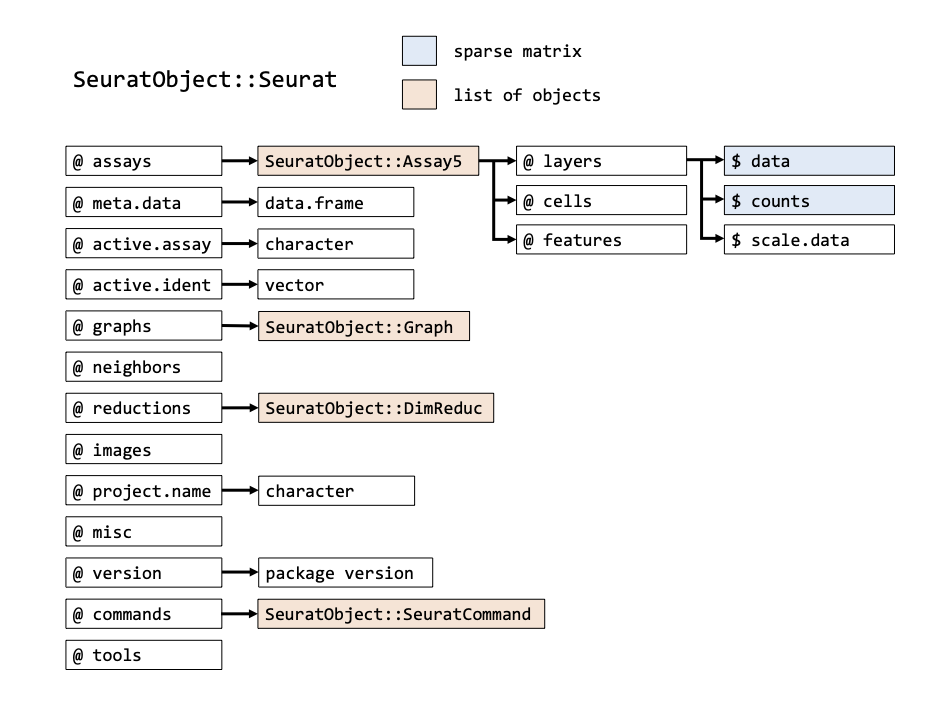


Image source: https://sib-swiss.github.io/single-cell-training/day1/day1-2_analysis_tools_qc.html

In [ ]:
metadata <- xenium.obj@meta.data
head(metadata, n=3)

,orig.ident,nCount_Xenium,nFeature_Xenium,segmentation_method,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,nCount_GenomicControl,nFeature_GenomicControl
,<fct>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
aaaaaohf-1,SeuratProject,557,417,Segmented by boundary stain (ATP1A1+CD45+E-Cadherin),0,0,0,0,0,0,0,0
aaaabkoj-1,SeuratProject,832,557,Segmented by boundary stain (ATP1A1+CD45+E-Cadherin),0,0,0,0,0,0,0,0
aaaafefl-1,SeuratProject,544,426,Segmented by boundary stain (ATP1A1+CD45+E-Cadherin),0,0,0,0,0,0,0,0


## 2.3 Transcript plotting functions for Xenium data

Plot total transcript per cell spatially

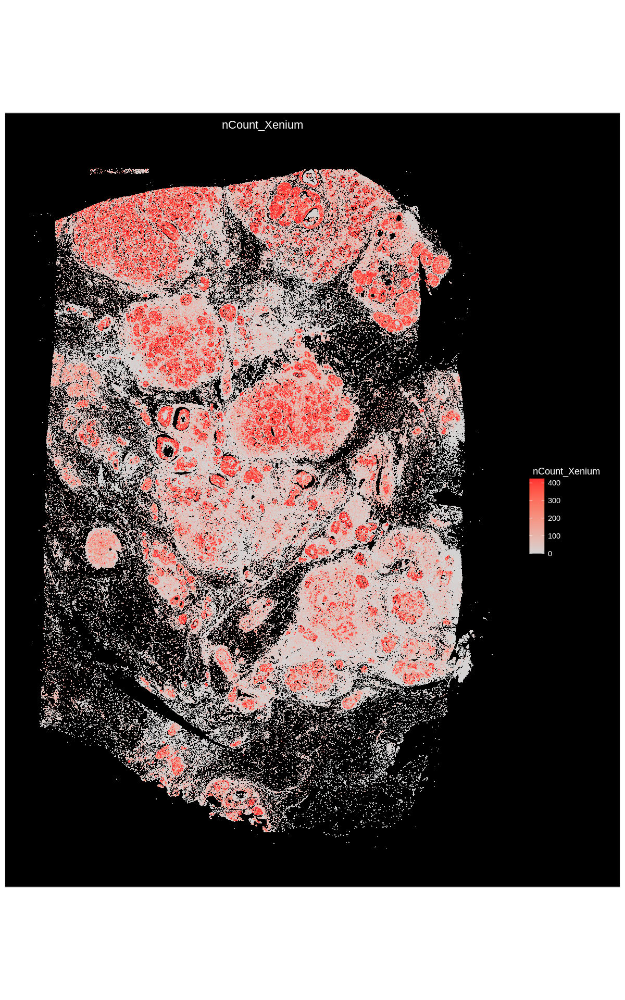

In [ ]:
# You can change "repr.plot.width" below to change plot width
# You can change "repr.plot.height" below to change plot height
options(repr.plot.width=10, repr.plot.height=16)

# max.cutoff="q95" - Color is capped at 95th percentile
ImageFeaturePlot(xenium.obj, fov = "fov",
                 features = c("nCount_Xenium"),
                 max.cutoff="q95")+
  scale_y_reverse()

Plot spatial gene expression for some genes of interest

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[assay]], vars = default.vars, :
“data layer is not found and counts layer is used”
Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[assay]], vars = default.vars, :
“data layer is not found and counts layer is used”


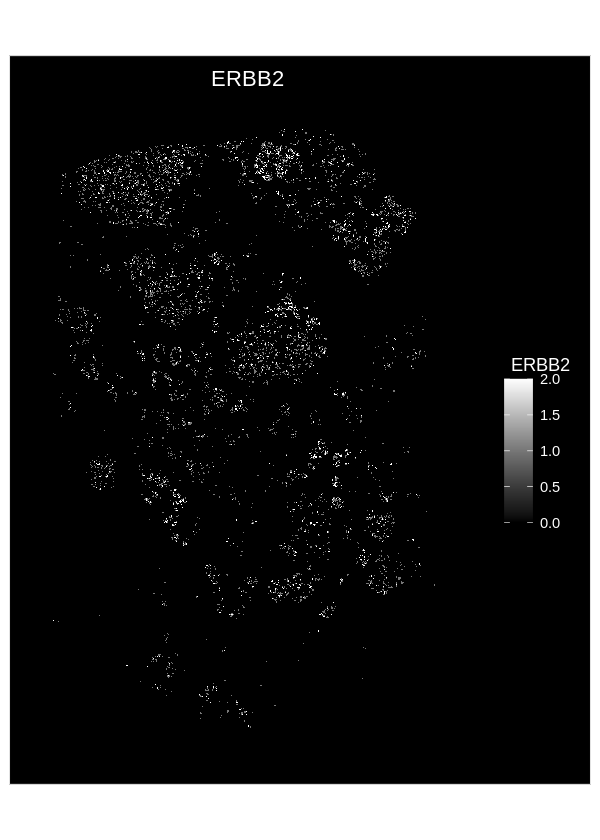

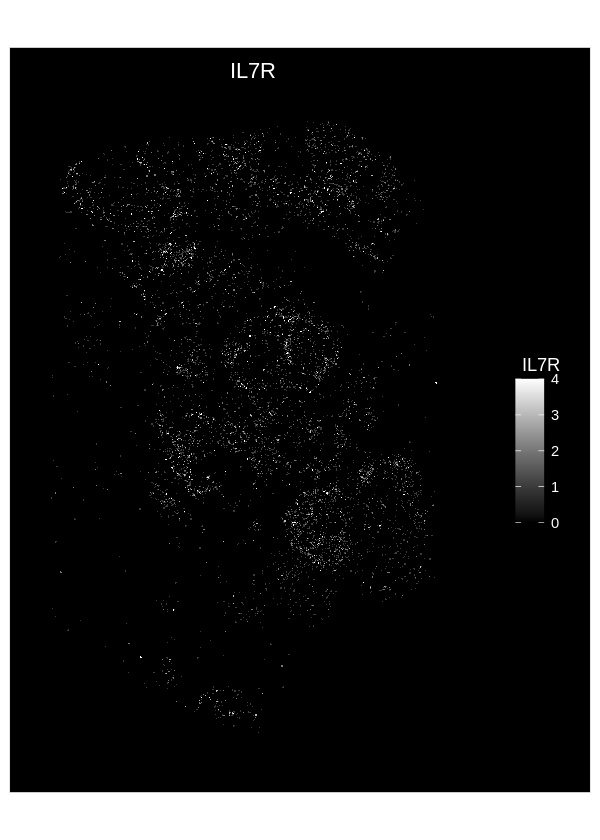

In [ ]:
options(repr.plot.width=5, repr.plot.height=7)
ImageFeaturePlot(xenium.obj, features = "ERBB2",
                 max.cutoff ="q95", cols=c("black","white"))+
  scale_y_reverse()

options(repr.plot.width=5, repr.plot.height=7)
ImageFeaturePlot(xenium.obj, features = "IL7R",
                 max.cutoff ="q95", cols=c("black","white"))+
  scale_y_reverse()

## 2.4 Select sub-region of interest

There are two ways to select sub-regions of interest


1.   By coordinates
2.   By cell IDs



### 2.4.1 Select sub-region by coordinates

First, select a sub-region of interest and download its coordinates.

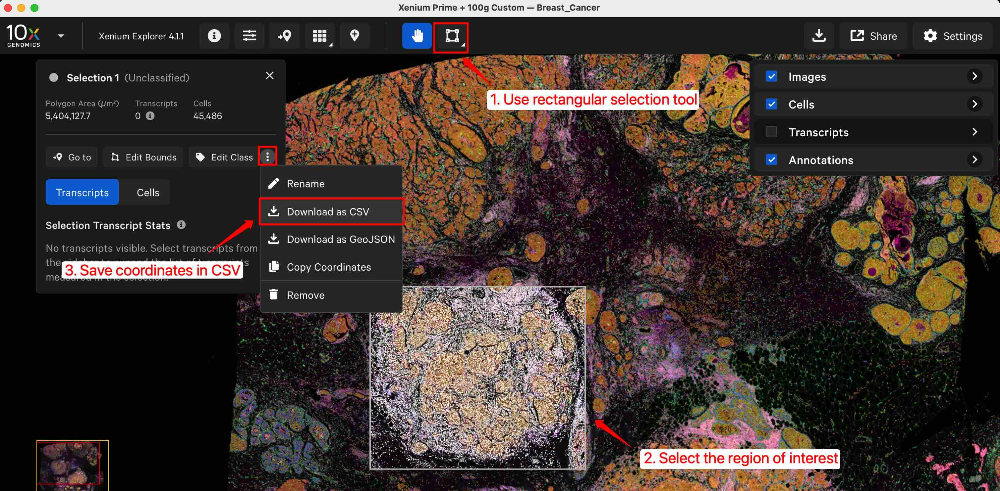

Here is an example of the coordinate CSV file obtained from Xenium Explorer

```
#Selection name: Selection 1
#Area (µm^2): 6238188.5
X,Y
2082.2669778917857,2883.948207577963
4605.827306527083,2883.948207577963
4605.827306527083,5355.927347229994
2082.2669778917857,5355.927347229994
2082.2669778917857,2883.948207577963
```



In [ ]:
min_x = 2082.2669778917857
min_y = 2883.948207577963
max_x = 4605.827306527083
max_y = 5355.927347229994

options(future.globals.maxSize = 1e10)
crop <- Crop(xenium.obj[["fov"]],
             x = c(min_x, max_x),
             y = c(min_y, max_y))

In [ ]:
# copy a new Xenium object so the rest part of this tutorial will not be affected by this change
xenium.obj.new <- xenium.obj


xenium.obj.new[["myarea"]] <- crop
xenium.obj.new

Warning message:
“Key ‘Xenium_’ taken, using ‘myarea_’ instead”


An object of class Seurat 
6181 features across 699110 samples within 5 assays 
Active assay: Xenium (5101 features, 0 variable features)
 1 layer present: counts
 4 other assays present: BlankCodeword, ControlCodeword, ControlProbe, GenomicControl
 2 spatial fields of view present: fov myarea

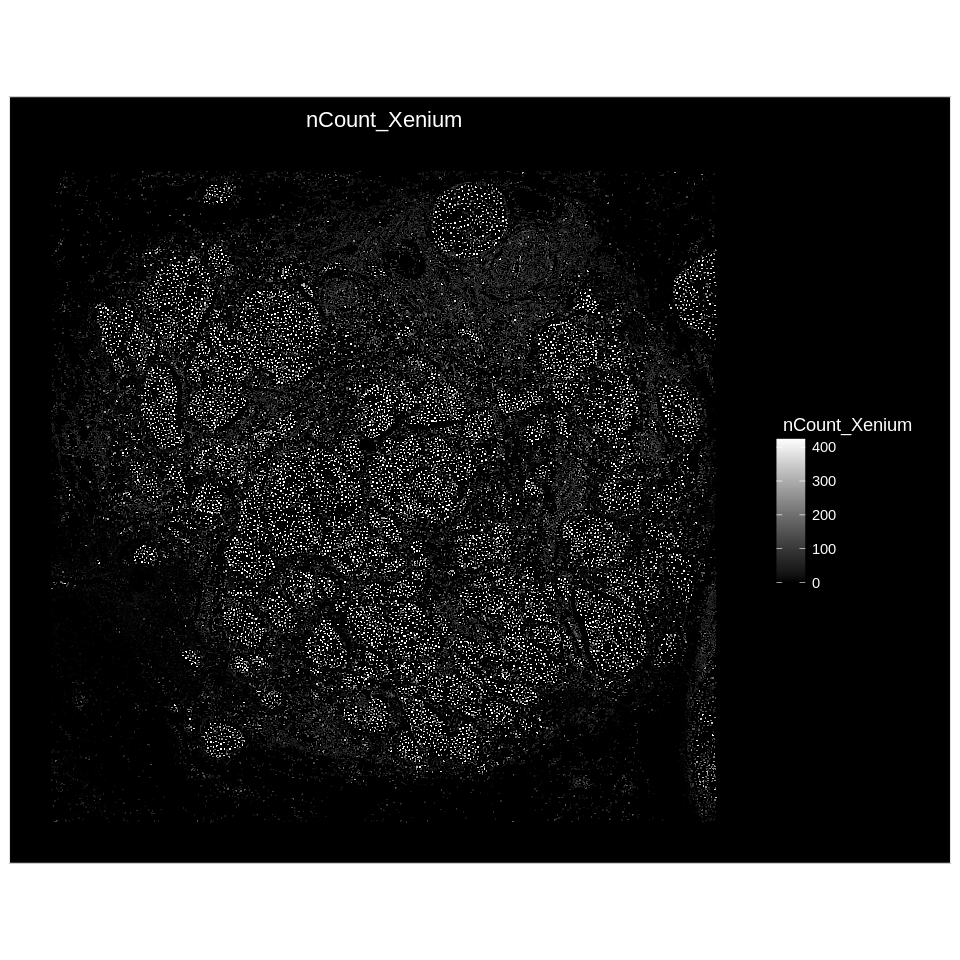

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
ImageFeaturePlot(xenium.obj.new, fov = "myarea",
                 features = c("nCount_Xenium"),
                 cols = c("black","white"),
                 max.cutoff="q95")+
  scale_y_reverse()

### 2.4.2 Select sub-region by cell IDs

First, select a sub-region of interest and download its cell stats CSV file.

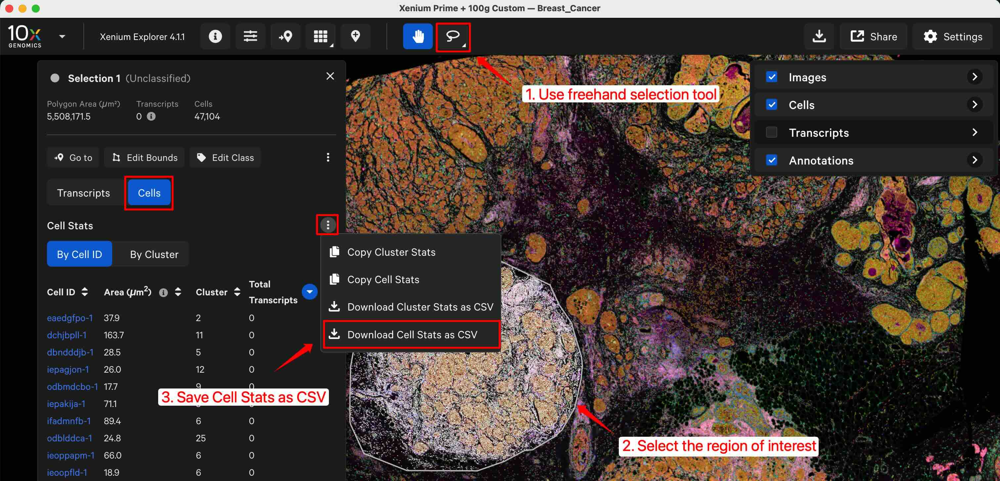

Upload the downloaded cell state CSV file to this Colab notebook. Here an example - "Selection_1_cells_stats.csv"

In [ ]:
# We have prepared "Selection_1_cells_stats.csv" for practice purpose here
# in your real analysis, please provide your own csv file.

# read csv
select_cells <- read.csv("./one-sample-analysis/Selection_1_cells_stats.csv", skip = 2, header = TRUE)
head(select_cells, n=3)

,Cell.ID,Cluster,Transcripts,Area..µm.2.
,<chr>,<chr>,<int>,<dbl>
1,eaedgfpo-1,Cluster 2,0,35.69
2,dchjbpll-1,Cluster 11,0,158.68
3,dbndddjb-1,Cluster 5,0,26.42


In [ ]:
# Get a separate Xenium seurat object for the selected cells
xenium.obj.sub <- subset(xenium.obj, cells = select_cells$Cell.ID)

In [ ]:
xenium.obj.sub

An object of class Seurat 
6181 features across 45239 samples within 5 assays 
Active assay: Xenium (5101 features, 0 variable features)
 1 layer present: counts
 4 other assays present: BlankCodeword, ControlCodeword, ControlProbe, GenomicControl
 1 spatial field of view present: fov

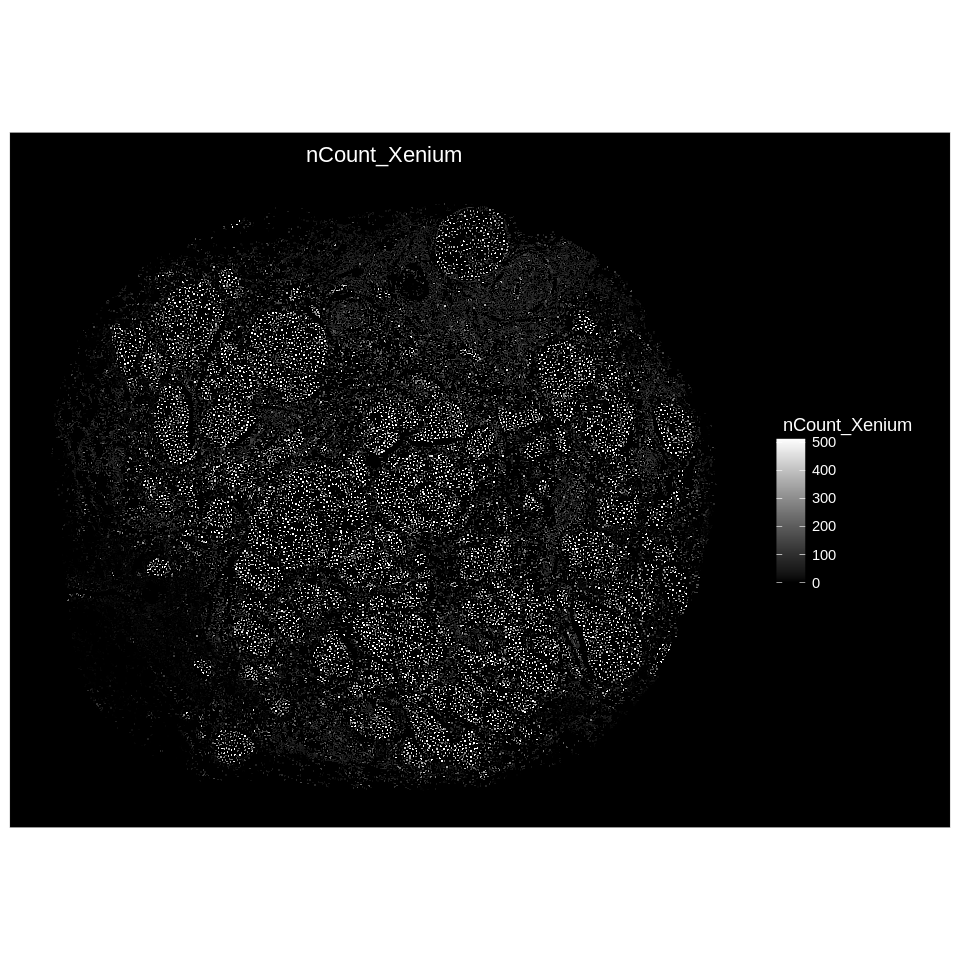

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
ImageFeaturePlot(xenium.obj.sub, fov = "fov",
                 features = c("nCount_Xenium"),
                 cols = c("black","white"),
                 max.cutoff="q95")+
  scale_y_reverse()

## 2.5 Xenium data downstream analysis

### 2.5.1 Data preprocessing

The first step is QC. We want to remove cells with low transcript counts. Here we plot the distribution of transcript counts per cell in a histogram to determine the transcript count cutoff to remove cells with low transcript counts. The determination of lower cutoff can be subjective. There is no gold-standard rule.  

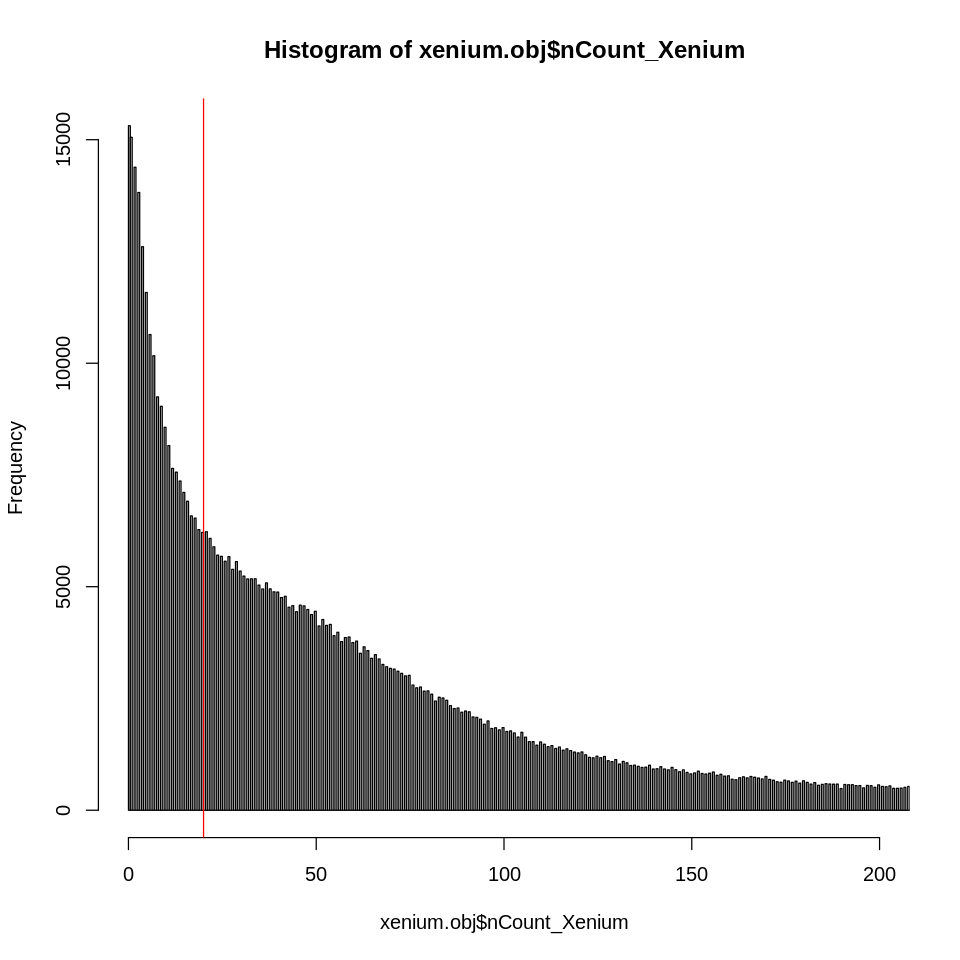

In [ ]:
# based on the histogram plot, here we choose 20 transcript counts as lower cutoff
hist(xenium.obj$nCount_Xenium, xlim=c(0,200), breaks = 5000)
abline(v = 20, col="red")

In [ ]:
## QC
## filtering cells based on detected transcripts per cell
## Upper limit cutoff - 98th percentile
## Lower limit cutoff - 20 determined by the previous plot

thres <- quantile(xenium.obj$nCount_Xenium, c(0.98))
xenium.obj <- subset(xenium.obj, subset = nCount_Xenium >= 20 & nCount_Xenium <= thres[1])

In [ ]:
## Normalization
## library size based normalization, scale factor - median transcript count
xenium.obj <- NormalizeData(xenium.obj, scale.factor=median(xenium.obj$nCount_Xenium))

Next, we find top 2k variable genes in this Xenium Prime data.

If you are analyzing Xenium v1 panel data, it's impossible to have top 2k variable genes. In that case, you can use all genes in the panel as variable genes. Run this code instead if you are using Xenium v1 panel:


`xenium.obj <- FindVariableFeatures(xenium.obj, nfeatures=nrow(xenium.obj))`

The following code is for Xenium Prime data (>5k genes).

In [ ]:
## Find top 2k variable genes
xenium.obj <- FindVariableFeatures(xenium.obj)

In [ ]:
## data scaling
xenium.obj <- ScaleData(xenium.obj)

In [ ]:
## PCA for dimensionality reduction
xenium.obj <- RunPCA(xenium.obj, verbose = FALSE)

In [ ]:
## 2D projection by UMAP
xenium.obj <- RunUMAP(xenium.obj, dims = 1:30, verbose = FALSE)

In [ ]:
## clustering
xenium.obj <- FindNeighbors(xenium.obj, dims = 1:30)
xenium.obj <- FindClusters(xenium.obj, resolution = .5)

### 2.5.2 Plot clustering results in UMAP

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



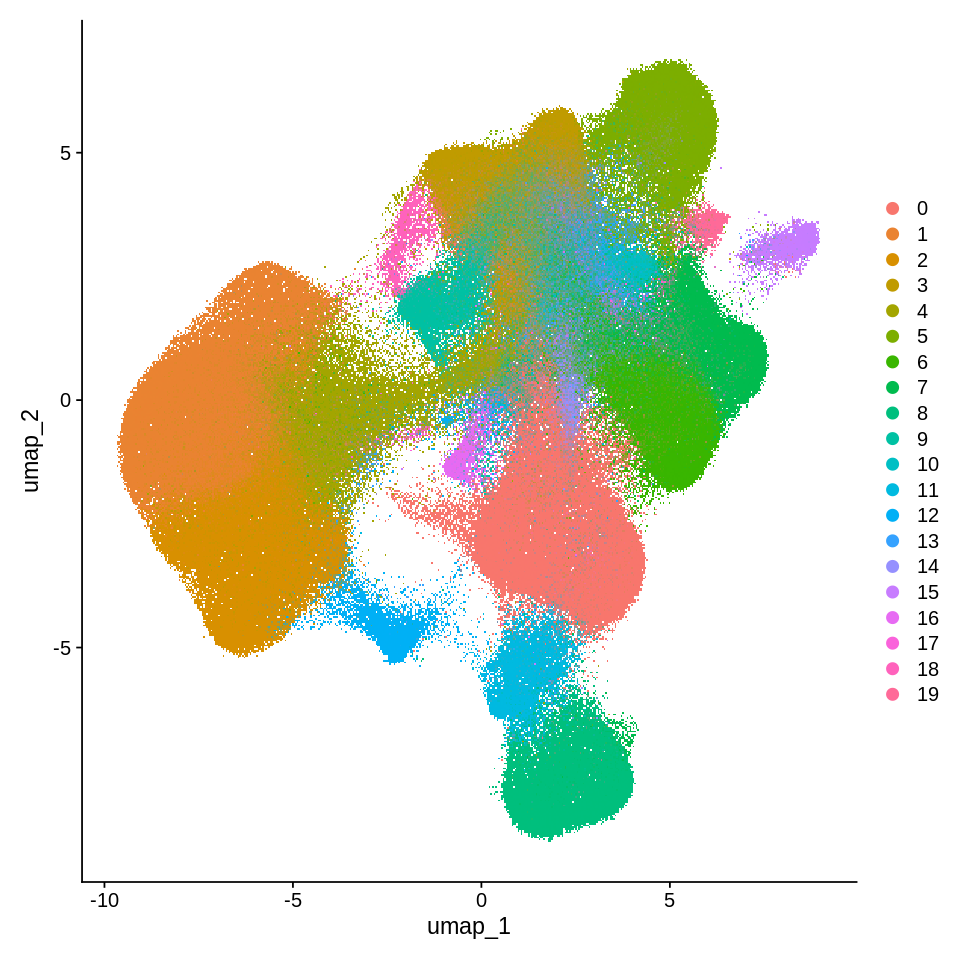

In [ ]:
## plot clustering results in UMAP
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(xenium.obj)

### 2.5.3 Plot clustering results spatially in slide

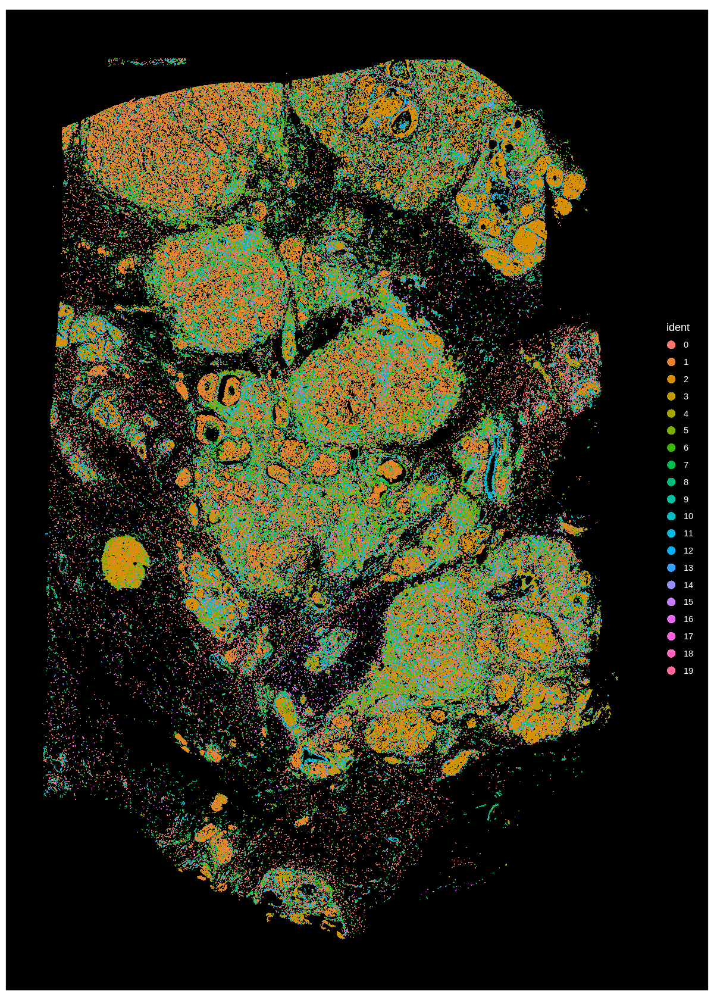

In [ ]:
## plot clustering results spatially in slide
options(repr.plot.width=10, repr.plot.height=14)
ImageDimPlot(xenium.obj)+
  scale_y_reverse()

### 2.5.4 Export clustering results and visualize in Xenium Explorer

Save clustering results in a CSV file. The CSV file has two columns - `cell_id` and `group`. Below is one example:

```
cell_id,group
aaaaaohf-1,1
aaaafefl-1,1
aaaahjao-1,1
aaaajdej-1,1
```



In [ ]:
# generate a table with two columns - one for cell id and the other for group (clustering)
clustering_res <- FetchData(xenium.obj, vars = c("seurat_clusters"))
clustering_res$cell_id <- rownames(clustering_res)

clustering_res <- clustering_res[,c("cell_id","seurat_clusters")]
colnames(clustering_res) <- c("cell_id","group")

head(clustering_res, n = 3)

,cell_id,group
,<chr>,<fct>
aaaaaohf-1,aaaaaohf-1,1
aaaafefl-1,aaaafefl-1,1
aaaahjao-1,aaaahjao-1,1


In [ ]:
# save the table in csv file
write.table(clustering_res, "seurat_clustering_results.csv",
            col.names=TRUE, row.names=FALSE, quote=FALSE, sep=",")

Follow the instructions below to import `seurat_clustering_results.csv` (exported seurat clusters in CSV file) into Xenium Explorer:

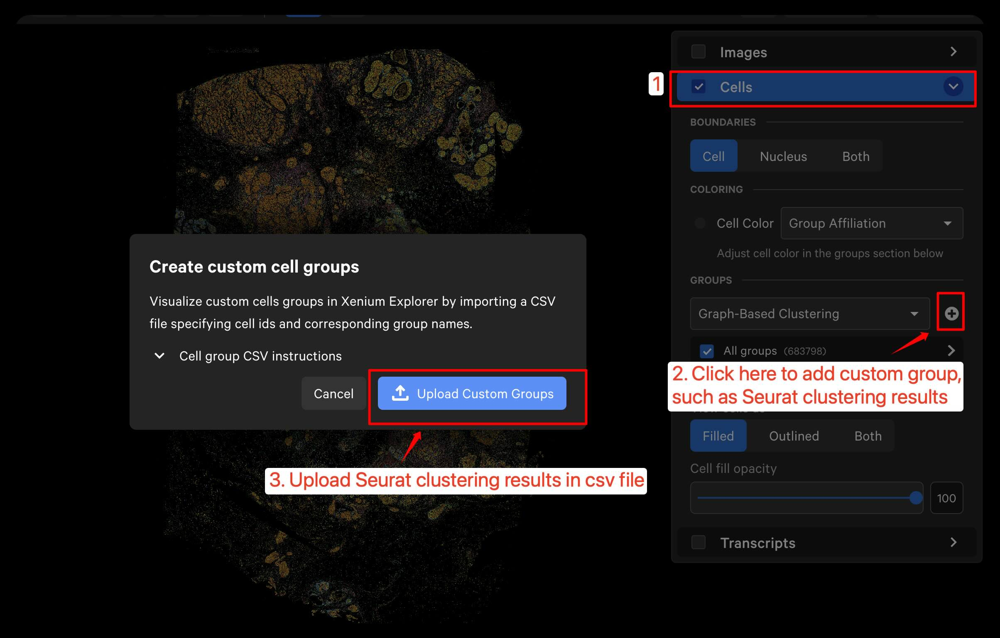

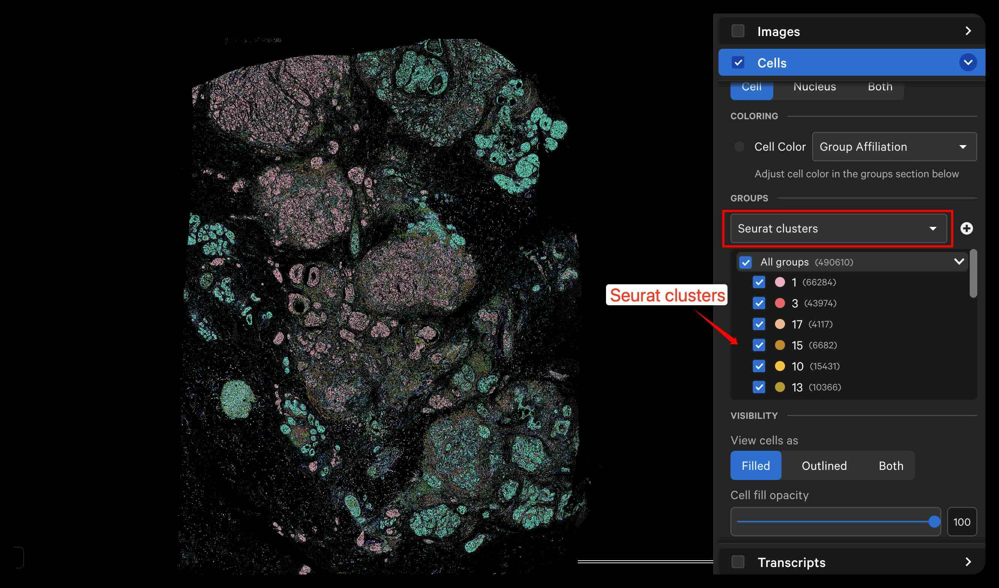

### 2.5.5 Find marker genes for each cluster (for cell annotation)

Use Seurat's function `FindAllMarkers` to identify marker genes in each cluster.

only.pos = TRUE: only return positive markers

min.pct = 0.05: genes expressed in at least 5% of cells in either of the compared cell populations are tested

logfc.threshold = 1: report at least 2 fold difference


In [ ]:
all.markers <- FindAllMarkers(xenium.obj, only.pos = TRUE,
                              min.pct = 0.05, logfc.threshold = 1)

In [ ]:
head(all.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
POSTN,0,4.766619,0.415,0.031,0,0,POSTN
LUM,0,4.102944,0.401,0.031,0,0,LUM
DCN,0,3.998113,0.397,0.039,0,0,DCN
CCL2,0,2.754723,0.374,0.074,0,0,CCL2
BGN,0,2.965639,0.339,0.057,0,0,BGN
SERPINE1,0,4.215260,0.308,0.029,0,0,SERPINE1


In [ ]:
# save marker gene results in csv file
write.table(all.markers, "marker_genes_in_seurat_clusters.csv",
            col.names=TRUE, row.names=FALSE, quote=FALSE, sep=",")

### 2.5.6 Cell annotation based on marker genes in each cluster

Based on marker genes (`marker_genes_in_seurat_clusters.csv`) in each cluster, we can identify each cell type.

Here we are sharing one possible way to annotate each cluster.

Step 1. Get marker genes in each cluster.

Step 2. Find cell type that is highly associated with the provided marker genes via third-party tools, such as [Enrichr](https://maayanlab.cloud/Enrichr/).

Step 3. Check spatial location of that cluster in Xenium Explorer (together with H&E image if any) and confirm its cell identity (some clusters' cell identities can be further supported by their spatial locations, such as tumor, vascular endothelial, etc.).


**Showing "endothelial" as an example below:**

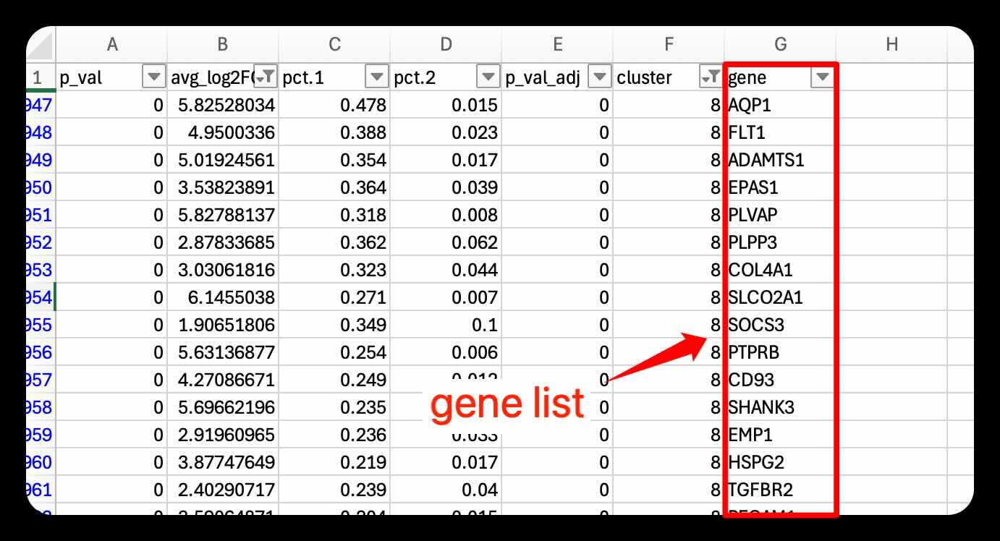

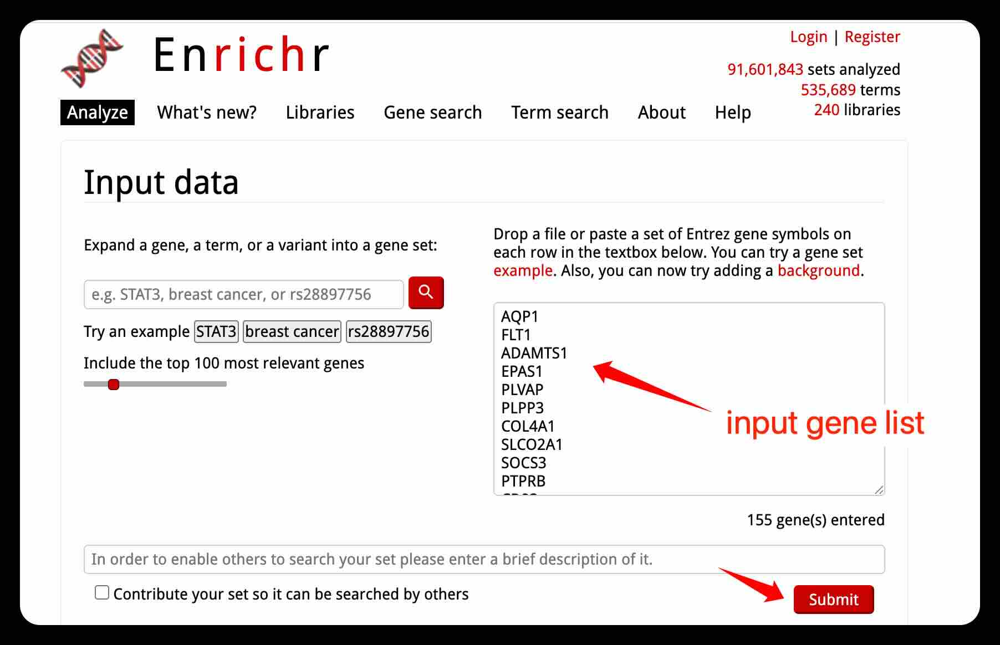

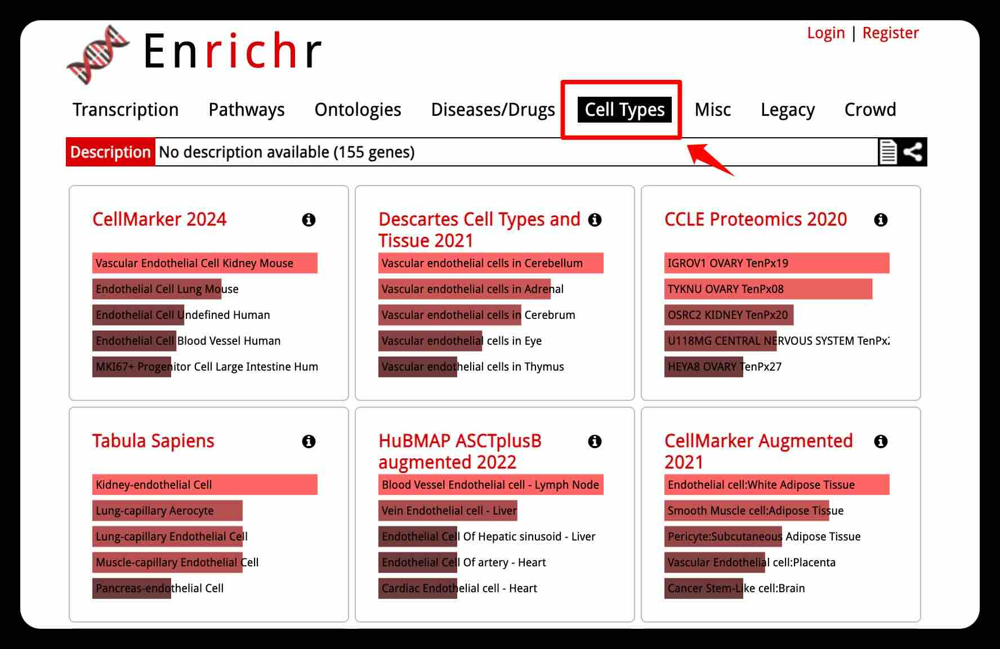

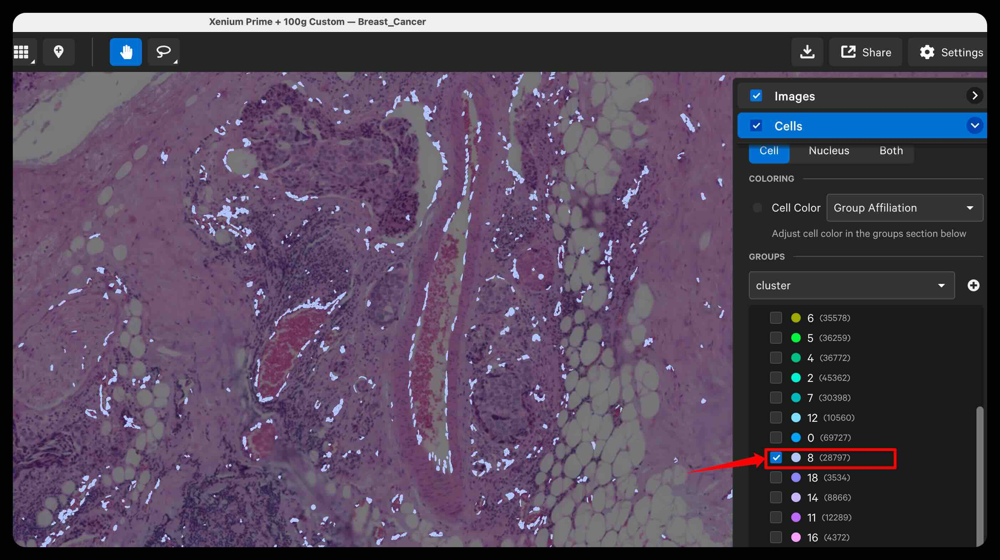

Based on the information above, we can identify cluster 6 as highly enriched with macrophage marker genes.

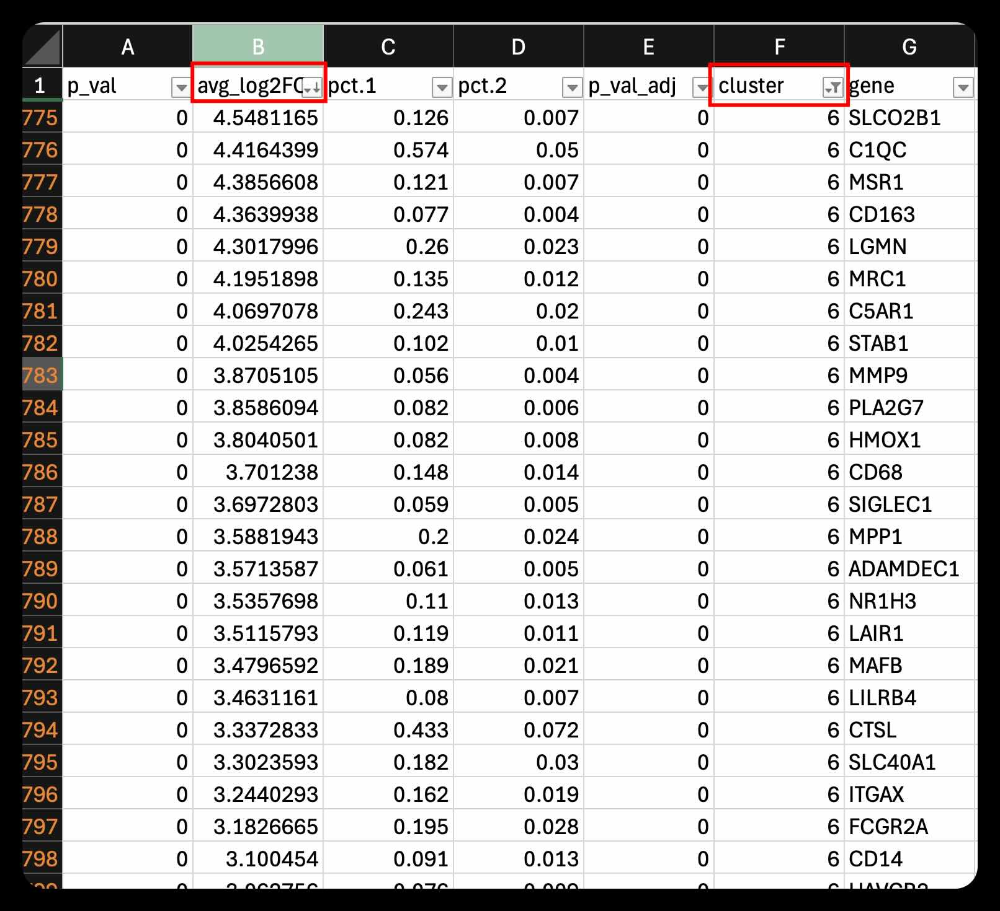

We can plot expression of macrophage marker genes, such as C1QC, across all clusters in a violin plot using Seurat's `VlnPlot` function. Indeed, C1QC is only highly expressed in cluster 6.

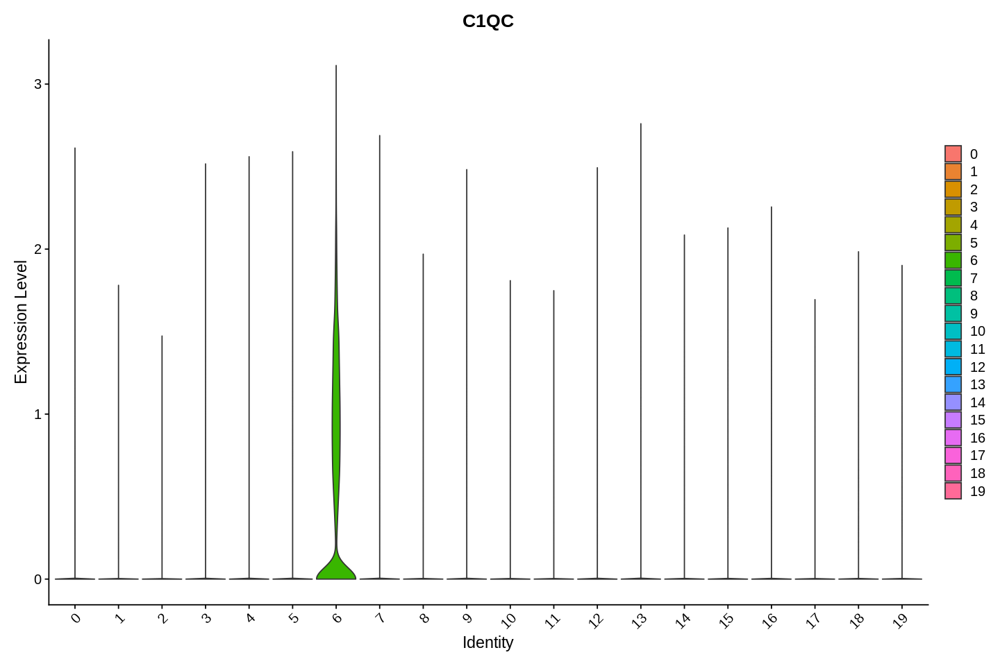

In [ ]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(xenium.obj, features = "C1QC", layer="data", pt.size=0)

Accordingly, we can rename cluster "6" to "Macrophage" in Xenium Explorer

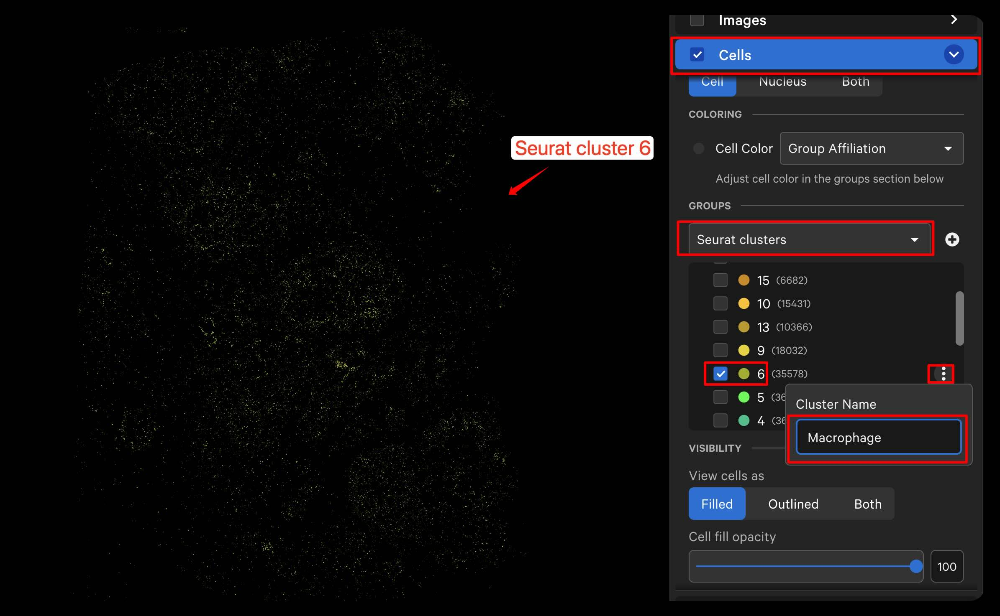

# **3. Xenium Prime multi-sample integration using Seurat sketch and Harmony**

Here, we are using two Xenium Prime datasets generated from the same Xenium gene panel. We recommend integration of Xenium data generated from the same gene panel. The integration of Xenium data generated from different Xenium gene panels is not recommended, since gene probe sets and codewords differ between gene panels.


The two Xenium datasets used in this sections are:
1.   [Human breast cancer Xenium Prime data](https://www.10xgenomics.com/datasets/xenium-prime-ffpe-human-breast-cancer)
2.   [Human cervical cancer Xenium Prime data](https://www.10xgenomics.com/datasets/xenium-prime-ffpe-human-cervical-cancer)

The analysis goal of the integration between breast and cervical cancer Xenium Prime data is to identify whether macrophages in these two cancer types could potentially have different functional roles.



Xenium data can be large. These two datasets (breast and cervical cancer) have in total more than 1.5 million cells. If analyzing full datasets, storing expression matrices in memory can be challenging. Here we use Seurat sketch to subsample cells from each large Xenium dataset, while preserving rare populations (see detailed Seurat sketch tutorial for multi-sample integration [here](https://satijalab.org/seurat/articles/parsebio_sketch_integration)). In this section, we will use Harmony to remove batch effects, which has been proven as one of the top performing tools for batch correction ([Tran, et al., 2020](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1850-9)).

In order to do integration, we only need the `cell_feature_matrix.h5` file from each Xenium data output (this file is automatically generated by the Xenium Onboard Analysis pipeline).


## 3.1 Loading R packages

In [ ]:
library(Seurat)
library(ggplot2)
library(BPCells)
library(SeuratWrappers)
# this is needed for large datasets
options(future.globals.maxSize = 1e10)

## 3.2 Downloading breast and cervical Xenium Prime data

Here we will need `cell_feature_matrix.h5` from both breast and cervical Xenium Prime outputs. We are downloading these two files from AWS for the demo. This file can be easily found in Xenium output bundle.

1.   Human breast cancer Xenium Prime: `./human_breast_xenium/cell_feature_matrix.h5`
2.   Human cervical cancer Xenium Prime: `./human_cervical_xenium/cell_feature_matrix.h5`





In [ ]:
system("wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/multi-sample-analysis.tar.gz")
system("tar -xzvf ./multi-sample-analysis.tar.gz")

## 3.3 Create on-disk representation for both Xenium data



In [ ]:
# load Xenium breast cancer data, and we only need "Gene Expression" feature
xenium.breast <- open_matrix_10x_hdf5(
  path = "./multi-sample-analysis/human_breast_xenium/cell_feature_matrix.h5",
  feature_type = "Gene Expression"
)

# Write the matrix on-disk
write_matrix_dir(mat = xenium.breast,
                 dir = "./xenium_breast_matrix",
                 overwrite = TRUE)

In [ ]:
# load Xenium cervical cancer data, and we only need "Gene Expression" feature
xenium.cervical <- open_matrix_10x_hdf5(
  path = "./multi-sample-analysis/human_cervical_xenium/cell_feature_matrix.h5",
  feature_type = "Gene Expression"
)

# Write the matrix on-disk
write_matrix_dir(mat = xenium.cervical,
                 dir = "./xenium_cervical_matrix",
                overwrite = TRUE)

Now we have matrix on disk and we can load it.

In [ ]:
# load on-disk matrix
xenium.breast.count <- open_matrix_dir(dir = "./xenium_breast_matrix")

Since there are multiple samples in this demo, it's good practice to make cell IDs unique across all integrated samples. Here, we add a suffix to the cell IDs. For example, we add "_breast" suffix to each cell ID in breast cancer data and "_cervical" suffix to each cell ID in cervical cancer data.

In [ ]:
# add "_breast" suffix to cell IDs
colnames(xenium.breast.count) <- paste(colnames(xenium.breast.count),"breast",sep = "_")

By default, gene Ensembl IDs are used in output matrix. Here, we can convert Ensembl IDs to gene names. For each Xenium output bundle, there is a `features.tsv.gz` file within the `cell_feature_matrix/` folder, which contains matched gene name for each gene Ensembl ID used in this data. We can use this file for conversion. This file has been downloaded in Section 3.2.

In [ ]:
# convert Ensembl IDs to gene names
features <- read.table("./multi-sample-analysis/human_breast_xenium/features.tsv.gz",
                       sep="\t", header=FALSE)
features <- features[(features$V3 == "Gene Expression"),]
features <- features[match(rownames(xenium.breast.count), features$V1),]
rownames(xenium.breast.count) <- features$V2

In [ ]:
# we do the same thing for cervical cancer data

# load on disk cervical cancer matrix
xenium.cervical.count <- open_matrix_dir(dir = "./xenium_cervical_matrix")

# add "_cervical" suffix to cell IDs
colnames(xenium.cervical.count) <- paste(colnames(xenium.cervical.count),"cervical",sep = "_")

# convert Ensembl IDs to gene names
features <- read.table("./multi-sample-analysis/human_cervical_xenium/features.tsv.gz",
                       sep="\t", header=FALSE)
features <- features[(features$V3 == "Gene Expression"),]
features <- features[match(rownames(xenium.cervical.count), features$V1),]
rownames(xenium.cervical.count) <- features$V2

### [Tip] What if I have multiple samples in one slide and their outputs are in one Xenium output bundle (one ROI)?

It's quite common that many tissues are placed in one Xenium slide (e.g. tissue microarray - TMA), those tissues are selected as one ROI (region of interest), and accordingly they are in one Xenium output bundle. How can we separate them and create on-disk representation for each sample, so that we can continue to Section 3.4 to integrate these multiple samples (from one slide)?

Example: how can we get the tissue region highlighted in the red circle below and create on-disk data for it?

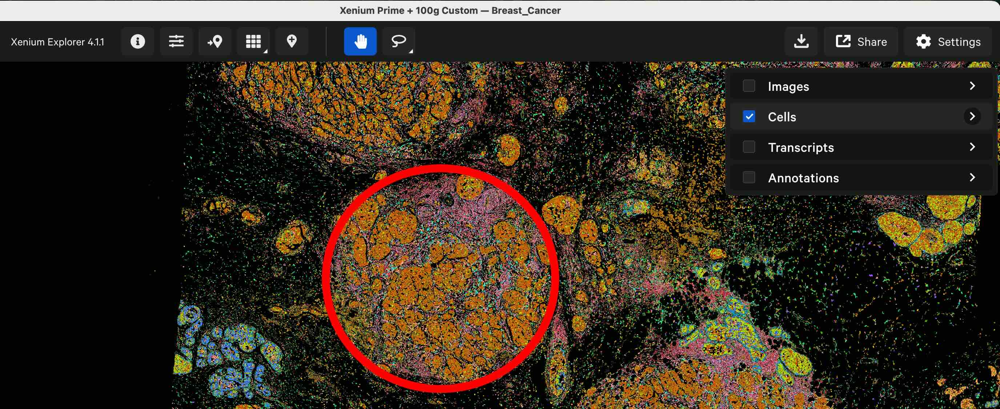

First, you can follow Section 2.4.2 to get cell IDs in a CSV for this region. In this case, we get cell IDs CSV file `Tissue_1_cells_stats.csv`. For practice, we have prepared this file `Tissue_1_cells_stats.csv`. Then what we need is `cell_feature_matrix.h5` file generated from Xenium output. Let's subset this gene expression matrix based on the obtained cell IDs and save the subset matrix on disk for the selected tissue region.

In [ ]:
# load gene expression data
gene_exp_data <- Read10X_h5("./multi-sample-analysis/human_breast_xenium/cell_feature_matrix.h5")
gene_exp_data <- gene_exp_data$`Gene Expression`

In [ ]:
# load cell IDs for the selected region
tissue1_cells <- read.csv("./multi-sample-analysis/Tissue_1_cells_stats.csv", skip = 2, header = TRUE)
head(tissue1_cells, n=3)

,Cell.ID,Cluster,Transcripts,Area..µm.2.
,<chr>,<chr>,<int>,<dbl>
1,eaedgfpo-1,Cluster 2,0,35.69
2,dchjbpll-1,Cluster 11,0,158.68
3,dbndddjb-1,Cluster 5,0,26.42


In [ ]:
# subset gene expression data based on the selected cell IDs
gene_exp_data_tissue1 <- gene_exp_data[,tissue1_cells$Cell.ID]

In [ ]:
# save subset gene expression data on disk
write_matrix_dir(mat = gene_exp_data_tissue1, dir = './tissue1_matrix', overwrite = TRUE)

# load tissue 1 on-disk representation
tissue1.mat <- open_matrix_dir(dir = "./tissue1_matrix")

# add "_tissue1" suffix to cell IDs
colnames(tissue1.mat) <- paste(colnames(tissue1.mat),"tissue1",sep = "_")

Now, we have on-disk representation for tissue 1 `tissue1.mat`. The data type `tissue1.mat` is the same as `xenium.breast.count` and `xenium.cervical.count` (used mainly in this section). We can use the same way to get on-disk data for tissues 2, 3, etc.

After getting all on-disk data for all tissues of interest, we can continue Section 3.4

----- End of Tip

## 3.4 Create a Seurat object (with both Xenium samples) with on-disk matrix

In [ ]:
# create a list having both breast and cervical on disk matrices
countlist <- list(xenium.breast.count, xenium.cervical.count)
names(countlist) <- c("breast","cervical")

In [ ]:
# create a Seurat object for both breast and cervical data
merge.obj <- CreateSeuratObject(countlist)

Since cells from both breast and cervical data are in one Seurat object, let's add one column `sample` to Seurat meta.data showing sample origin for each cell.

In [ ]:
samples <- sapply(strsplit(colnames(merge.obj),"_"),function(X){return(X[2])})
merge.obj$samples <- samples

## 3.5 "Sketch" subsampled cells and load these cells in memory

The first step is QC. We want to remove cells with low transcript counts. Here we plot the distribution of transcript counts per cell in a histogram to determine the transcript count cutoff to remove cells with low transcript counts. The determination of lower cutoff can be subjective. There is no gold-standard rule.

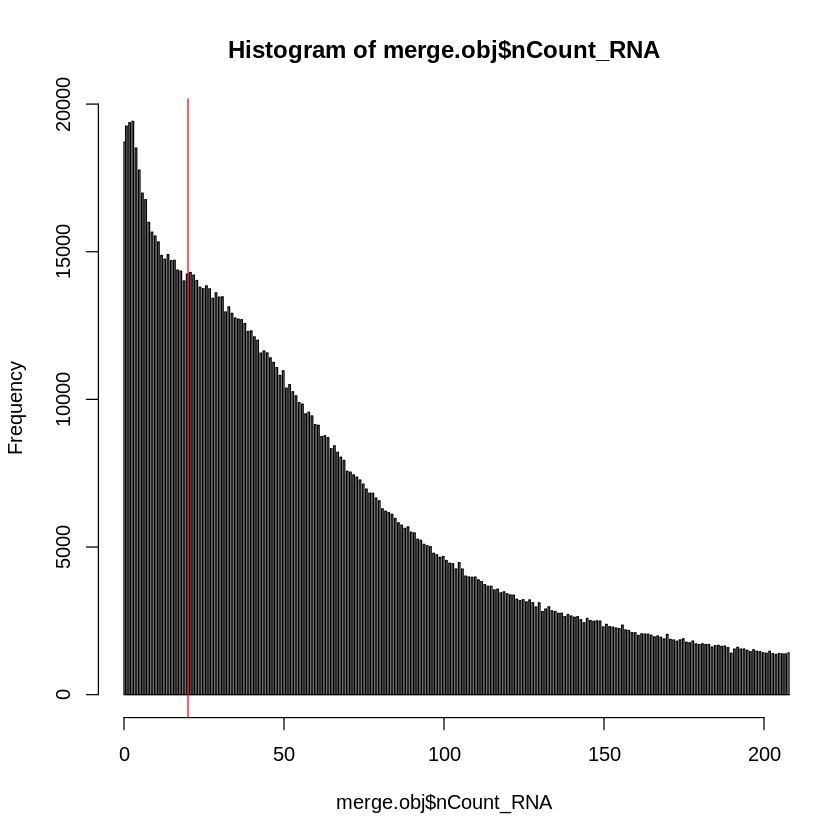

In [ ]:
# based on the histogram plot, here we choose 20 transcript counts as lower cutoff
hist(merge.obj$nCount_RNA, xlim=c(0,200), breaks = 5000)
abline(v = 20, col="red")

In [ ]:
## QC
## filtering cells based on detected transcripts per cell
## Upper limit cutoff - 98th percentile
## Lower limit cutoff - 20
# runtime: 43s
thres <- quantile(merge.obj$nCount_RNA, c(0.98))
merge.obj <- subset(merge.obj, subset = nCount_RNA >= 20 & nCount_RNA <= thres[1])

In [ ]:
## Normalization
## library size based normalization, scale factor - median transcript count
## runtime: 28s
merge.obj <- NormalizeData(merge.obj,scale.factor=median(merge.obj$nCount_RNA))

Next, we find top 2k variable genes in this Prime data.

If you are analyzing Xenium v1 panel data, it's impossible to have top 2k variable genes. In that case, you can use all genes in the panel as variable genes. Run this code instead if you are using Xenium v1 panel:


`merge.obj <- FindVariableFeatures(merge.obj, nfeatures=nrow(merge.obj))`

The following code is for Xenium Prime data (>5k genes).

In [ ]:
## Find top 2k variable genes
# runtime: 18s
merge.obj <- FindVariableFeatures(merge.obj, verbose = FALSE)

We select 25k cells per each Xenium data (25k from breast data and 25k from cervical data). Sampling based on "LeverageScore" can retain rare cell populations. After sampling, we will get a new assay `sketch` consisting of 50k cells (these 50k cell data are in memory). We can switch assay from `sketch` to `RNA`, in order to switch in-memory data (50k cells) to on-disk data (all cells).

In [ ]:
## you will need to change ncells (downsample number) based on cell number you have per sample
## ncells = 25000 (meaning selecting 25k cells for each of both data);
## if we set ncells = c(25000, 35000), it will downsample 25k for breast data and 35k for cervical data
## runtime: 4mins
merge.obj <- SketchData(merge.obj, ncells = 25000,
                        method = "LeverageScore",
                        sketched.assay = "sketch",
                        features = VariableFeatures(merge.obj))

In [ ]:
merge.obj

An object of class Seurat 
10202 features across 1182865 samples within 2 assays 
Active assay: sketch (5101 features, 2000 variable features)
 4 layers present: counts.breast, counts.cervical, data.breast, data.cervical
 1 other assay present: RNA

## 3.6 Conventional data processing

Now we are doing analysis on the representative 50k cells (in `sketch` assay) downsampled from all cells (in `RNA` assay). Since the subset is only 50k cells, the analysis is much faster. Conventional data processing includes: finding variable genes, data scaling, and PCA.

In the following step, there is a function `FindVariableFeatures` used for feature selection (top 2k).

If you are analyzing Xenium v1 panel data, it's impossible to have top 2k variable genes. In that case, you can use all genes in the panel as variable genes. Run this code instead if you are using Xenium v1 panel:


`merge.obj <- FindVariableFeatures(merge.obj, nfeatures=nrow(merge.obj))`

The following code is for Xenium Prime data (>5k genes).

In [ ]:
## runtime: 1min
DefaultAssay(merge.obj) <- "sketch"
merge.obj <- FindVariableFeatures(merge.obj, verbose = FALSE)
merge.obj <- ScaleData(merge.obj, verbose = FALSE)
merge.obj <- RunPCA(merge.obj, verbose = FALSE)

## 3.7 Batch correction by Harmony

Before doing batch correction, we can check if there are significant batch effects between these two data. We will project cells in 2D UMAP space _without_ any batch correction and visualize cells by their sample origin. If most of the cell types are well separated between samples in UMAP space, there could be batch effects.

In [ ]:
# directly run UMAP on uncorrected PCA results (aka without batch correction)
# runtime: 1min
merge.obj <- RunUMAP(merge.obj, dims = 1:30, return.model = TRUE, verbose = FALSE)

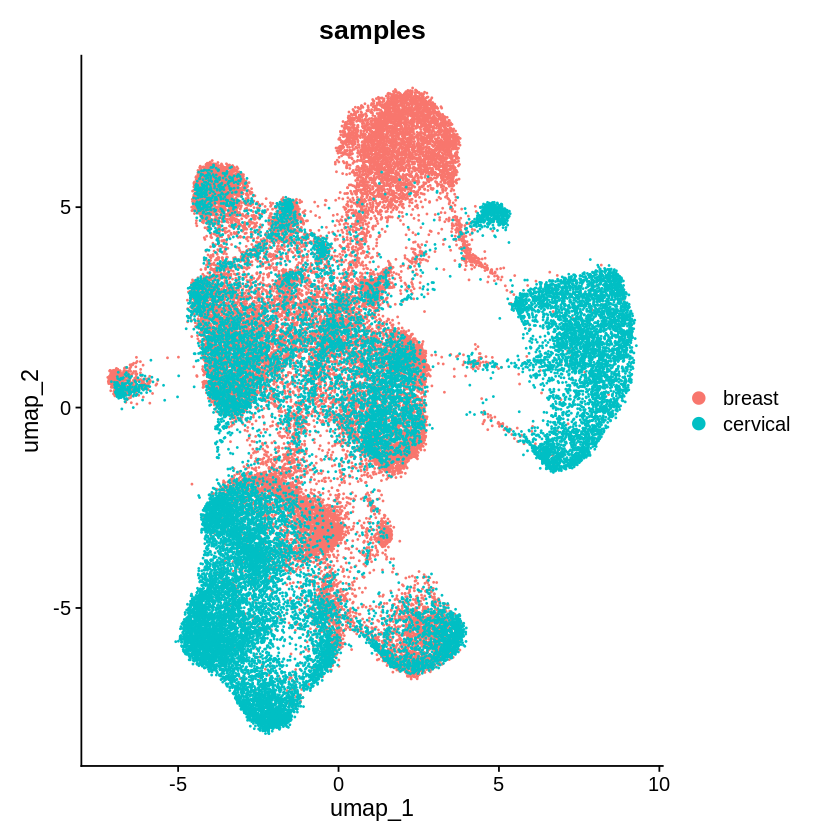

In [ ]:
# plot UMAP and color cells by sample origins
DimPlot(merge.obj, group.by = "samples")

After projecting cells on 2D UMAP space without batch correction, we can see most of cells in stroma/fibroblast and immune components are well merged in UMAP space, while breast cancer cells and cervical cancer cells are very well separated (this is expected as these two types of cancer cells have very different gene expression). It suggests batch effects are not very significant. These two data were generated using the same Xenium gene panel and in the same run.

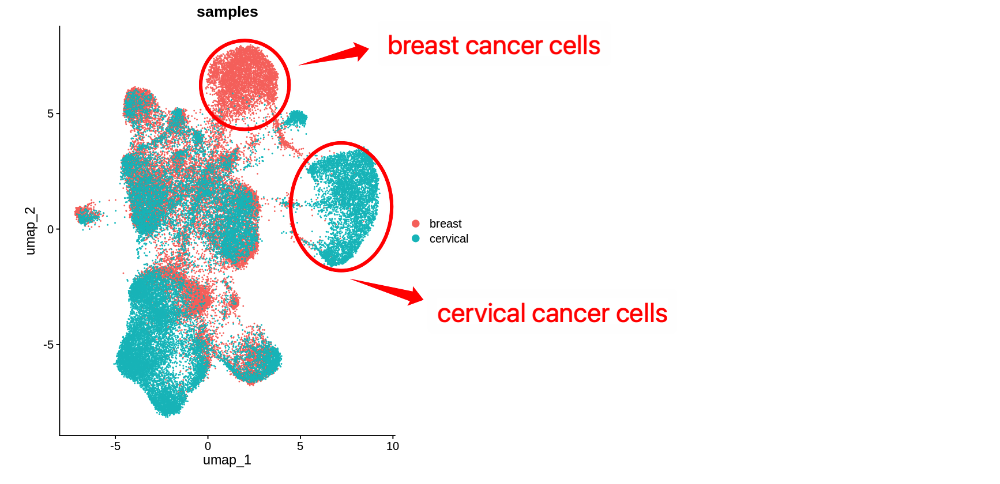

If there are significant batch effects, we can use Harmony to correct batch effects. To demonstrate, we will proceed with batch correction.

Harmony will correct `PCA` space (which contains variations from batch effects).

After removing batch effects, Harmony will generate new corrected reduced-dimension results, which we can call  "harmony" space.



In [ ]:
## runtime: 4mins
merge.obj <- IntegrateLayers(merge.obj, method = HarmonyIntegration,
                             orig = "pca", new.reduction = "harmony",
                             dims = 1:30)

In [ ]:
merge.obj

An object of class Seurat 
10202 features across 1182865 samples within 2 assays 
Active assay: sketch (5101 features, 2000 variable features)
 5 layers present: counts.breast, counts.cervical, data.breast, data.cervical, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

Based on batch-corrected space from Harmony, we can do UMAP projection and clustering.

In [ ]:
# UMAP analysis based on batch-corrected Harmony space
# runtime: 1min
merge.obj <- RunUMAP(merge.obj, reduction = "harmony", dims = 1:30,
                    return.model = TRUE, verbose = FALSE)

In [ ]:
# clustering based on batch-corrected Harmony space
# runtime: 55s
merge.obj <- FindNeighbors(merge.obj, reduction = "harmony", dims = 1:30)
merge.obj <- FindClusters(merge.obj, resolution = 1, verbose = FALSE)

Now we can plot UMAP (batch-corrected) and label cells by sample origin and also clustering results (batch-corrected)

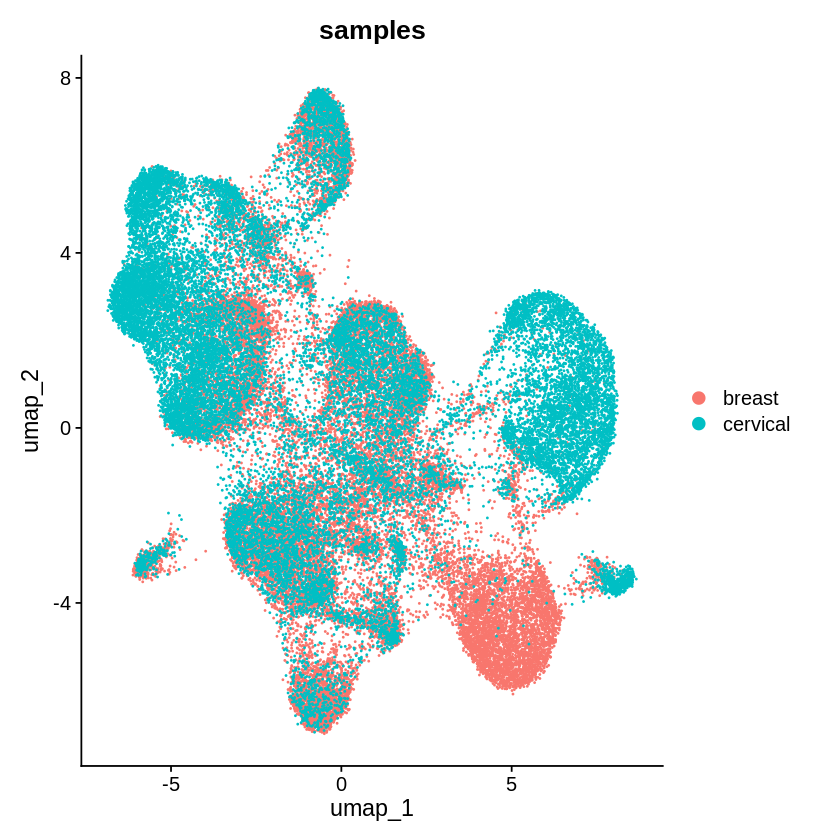

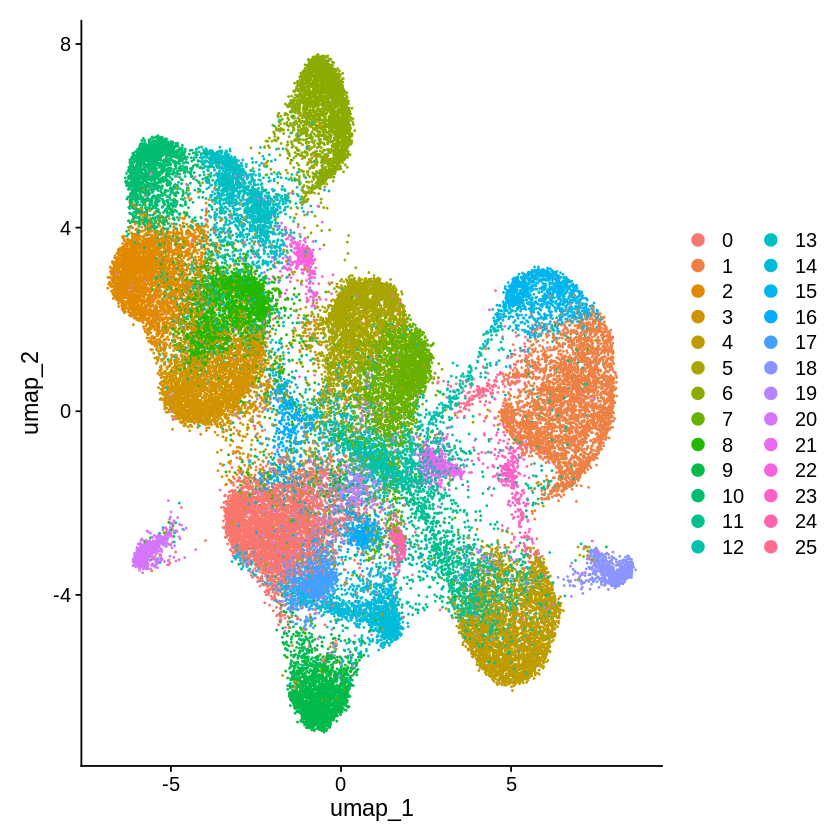

In [ ]:
# plot UMAP after batch correction
DimPlot(merge.obj, group.by = "samples")
DimPlot(merge.obj)

## 3.8 Project results from "sketch" 50k cells to all cells

Since Harmony space (batch-corrected space), UMAP, and clustering are computed based on 50k "sketch" cells, we can project these results from 50k cells to _all_ cells.

In [ ]:
# project Harmony results from 50k cells (sketch) to all cells (RNA)
# after projection, Harmony space for all cells is generated as harmony.full
# runtime: 46s
merge.obj <- ProjectIntegration(object = merge.obj,
                                sketched.assay = "sketch", assay = "RNA",
                                reduction = "harmony")

In [ ]:
# project batch-corrected clustering results from 50k cells to all cells ("cluster_full")
# project batch-corrected UMAP results from 50k cells to all cells ("full.umap")
# runtime: 8mins
merge.obj <- ProjectData(
  object = merge.obj,
  assay = "RNA",
  full.reduction = "harmony.full",
  sketched.assay = "sketch",
  sketched.reduction = "harmony.full",
  umap.model = "umap",
  dims = 1:30,
  refdata = list(cluster_full = "seurat_clusters")
)

After projecting results from 50k cells to all cells, we can visualize UMAP results for all cells after batch correction.

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



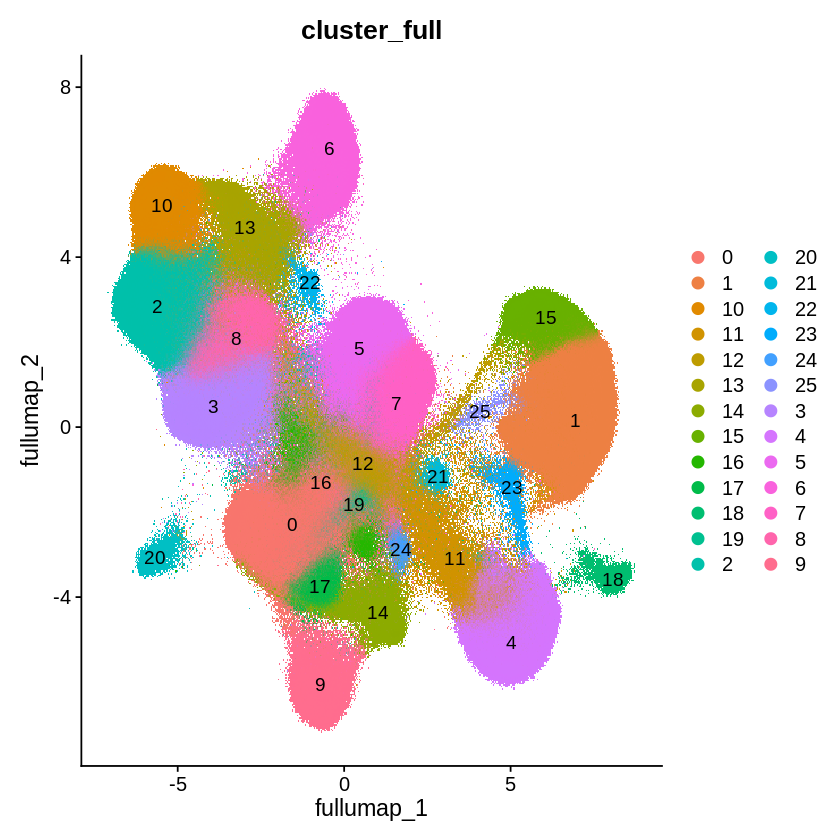

In [ ]:
DimPlot(merge.obj, reduction = "full.umap", group.by = "cluster_full",label = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



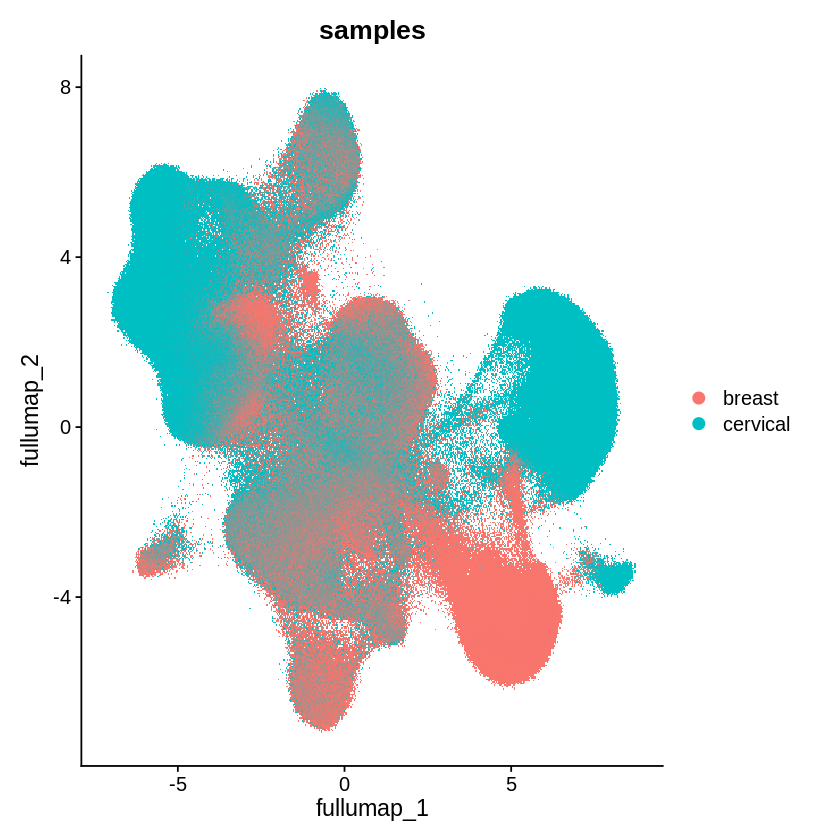

In [ ]:
DimPlot(merge.obj, reduction = "full.umap", group.by = "samples")

## 3.9 Export all cell clustering results in CSV and import to Xenium Explorer

After batch correction, we can export batch-corrected clustering results in CSV files for both breast cancer and cervical cancer data separately. We can import each sample's clustering results (generated by integrated analysis) into its own Xenium Explorer interface.

In [ ]:
clusters_all <- FetchData(merge.obj, vars = c("cluster_full","samples"))

# since we added suffix in cell IDs in section 3.3, here we need to remove suffix, back to original IDs
clusters_all$cell_id <- sapply(strsplit(rownames(clusters_all),"_"),function(X){return(X[1])})
head(clusters_all)

,cluster_full,samples,cell_id
,<chr>,<chr>,<chr>
aaaahjao-1_breast,4,breast,aaaahjao-1
aaaajdej-1_breast,4,breast,aaaajdej-1
aaaakcik-1_breast,4,breast,aaaakcik-1
aaaaknop-1_breast,4,breast,aaaaknop-1
aaaamepl-1_breast,4,breast,aaaamepl-1
aaaanang-1_breast,4,breast,aaaanang-1


In [ ]:
# get clustering results for breast cancer data
clusters_all_breast <- clusters_all[(clusters_all$samples == "breast"),c("cell_id","cluster_full")]
colnames(clusters_all_breast) <- c("cell_id","group")
write.table(clusters_all_breast,"integrated_clusters_for_breast.csv",
            sep=",", col.names=TRUE, row.names=FALSE, quote=FALSE)

In [ ]:
# get clustering results for cervical cancer data
clusters_all_cervical <- clusters_all[(clusters_all$samples == "cervical"),c("cell_id","cluster_full")]
colnames(clusters_all_cervical) <- c("cell_id","group")
write.table(clusters_all_cervical,"integrated_clusters_for_cervical.csv",
            sep=",", col.names=TRUE, row.names=FALSE, quote=FALSE)

We can follow the same steps as shown in section 2.5.4 to import the clustering results CSV file into Xenium Explorer for each dataset.

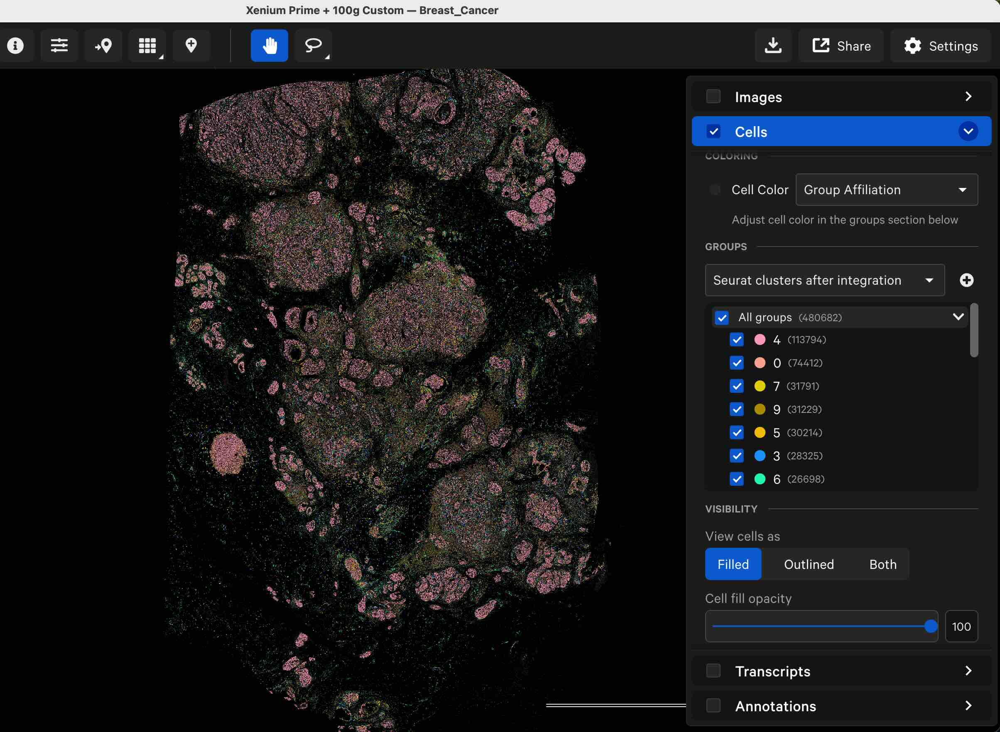

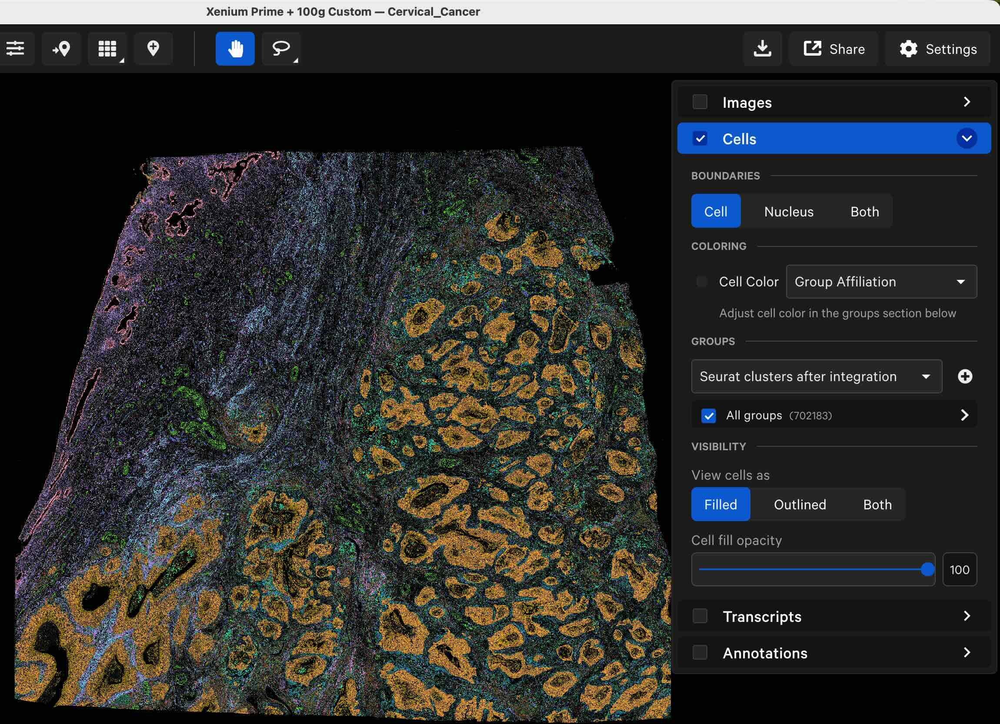

## 3.10 Find cluster marker genes for cell annotation

We can compute marker genes in each cluster and accordingly annotate each cluster from both datasets.

In [ ]:
DefaultAssay(merge.obj) <- "sketch"

# join breast and cervical matrices in sketch (50k cells)
merge.obj[["sketch"]] <- JoinLayers(merge.obj[["sketch"]])

# calculate marker genes for each cluster
all.markers <- FindAllMarkers(merge.obj, only.pos = TRUE)

In [ ]:
# save marker gene results in csv
write.table(all.markers,"markers_for_all_clusters_in_sketch.csv", sep=",", col.names = TRUE,
            row.names=FALSE, quote=FALSE)

Based on the marker gene results, we can identify that cluster 5 is highly enriched with macrophage marker genes.


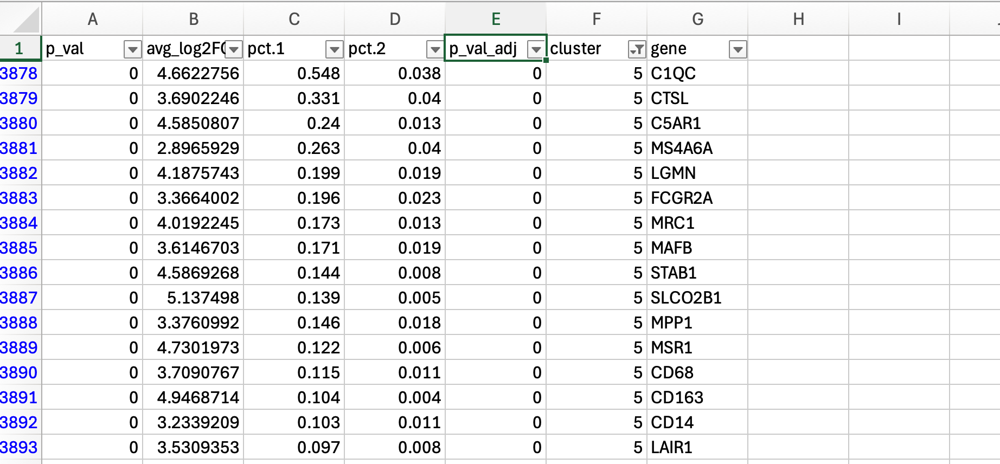

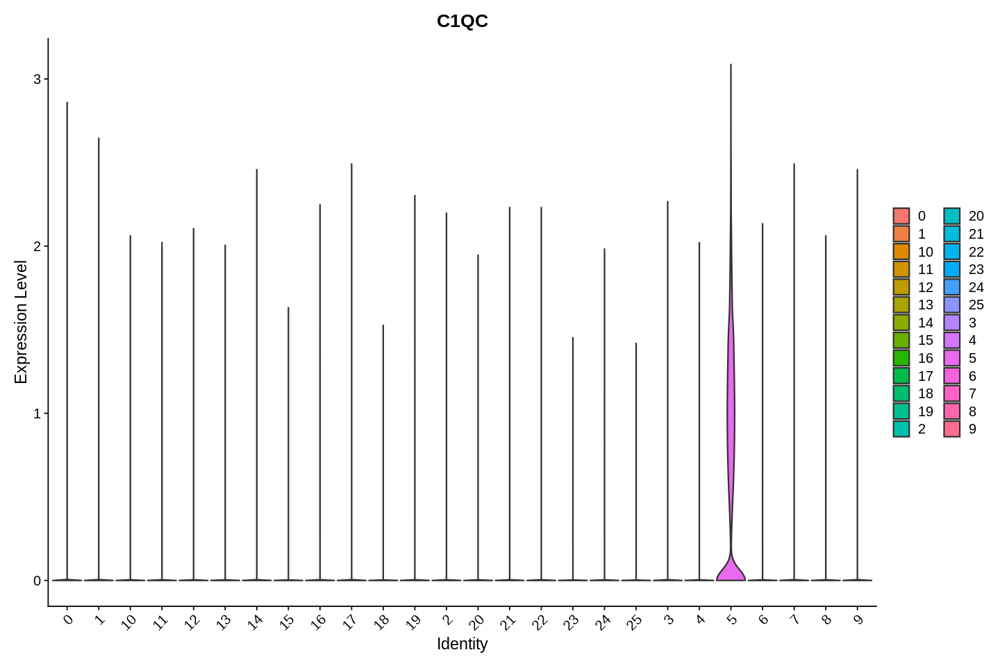

In [ ]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(merge.obj, assay = "RNA", features = c("C1QC"),
        layer="data", pt.size=0, group.by="cluster_full")

### [Tip] How to save this Seurat object (with 50k cells in memory and all cells on disk)?

We can use `saveRDS` to save this Seurat (with sketch) in a rds file locally. Please note that this Seurat object also links to on-disk data (in the folders `xenium_breast_matrix` and `xenum_cervical_matrix`). Hence, the complete saved data includes the saved Seurat object rds file + all on-disk data folders.

In [ ]:
# save integrated Seurat object in rds
saveRDS(merge.obj, "Xenium_integrated_Seurat.rds")

In this demo case, we need to keep `Xenium_integrated_Seurat.rds` + `xenium_breast_matrix/` + `xenum_cervical_matrix/` as a whole.

Next time when we reload this integrated Seurat object, we just need to use `readRDS` to read `.rds` file. On-disk data folders also need to be present (`xenium_breast_matrix` and `xenum_cervical_matrix`).

In [ ]:
# reload integrated Seurat object from rds
merge.obj <- readRDS("./Xenium_integrated_Seurat.rds")

-------- End of Tip

## 3.11 Subset Seurat object for macrophages

Below we subset macrophages only and compare gene expression in macrophages between breast cancer and cervical cancer data. The demonstration below is for exploration purposes to compare macrophages between two tissues. The p-values obtained from this analysis should be interpreted with caution, because these tests treat each cell as an independent replicate, which could cause false positives.

**A more robust statistical test for differentially expressed genes (DEG) between conditions requires biological replicates (at least 3 biological replicates per condition are recommended) and pseudo-bulk DEG analysis approach can be used for this analysis.** See documentation below:

*   [Differential Gene Expression Analysis in scRNA-seq Data between Conditions with Biological Replicates](https://www.10xgenomics.com/analysis-guides/differential-gene-expression-analysis-in-scrna-seq-data-between-conditions-with-biological-replicates)
*   [Use Seurat for pseudo-bulk DE analysis](https://satijalab.org/seurat/articles/de_vignette#perform-de-analysis-after-pseudobulking)


In [ ]:
# get all cell IDs for cluster 5 (macrophage)
macrophage_cells <- names(merge.obj$cluster_full[(merge.obj$cluster_full == 5)])

In [ ]:
# based on macrophage cell IDs, subset Seurat object
macro.obj <- subset(merge.obj, cells = macrophage_cells)

In [48]:
macro.obj

An object of class Seurat 
10202 features across 54970 samples within 2 assays 
Active assay: sketch (5101 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 1 other assay present: RNA
 5 dimensional reductions calculated: pca, umap, harmony, harmony.full, full.umap

Re-do analyses **on macrophage cells only**: Find variable genes, data scaling, PCA, harmony correction (on PCA), UMAP projection and clustering.

Since there are only 58k macrophages, we will do analysis on all cells (`RNA` assay).

In the following step, there is function `FindVariableFeatures` used for feature selection (top 2k).

If you are analyzing Xenium v1 panel data, it's impossible to have top 2k variable genes. In that case, you can use all genes in the panel as variable genes. Run this code instead if you are using Xenium v1 panel:


`macro.obj <- FindVariableFeatures(macro.obj, nfeatures=nrow(macro.obj))`

The following code is for Xenium Prime data (>5k genes).

In [ ]:
DefaultAssay(macro.obj) <- "RNA"
macro.obj <- FindVariableFeatures(macro.obj, verbose = FALSE)
macro.obj <- ScaleData(macro.obj, verbose = FALSE)
macro.obj <- RunPCA(macro.obj, verbose = FALSE)

In [ ]:
# batch correction using harmony
# correcting PCA
# corrected space is named as harmony.full
macro.obj <- IntegrateLayers(macro.obj, method = HarmonyIntegration,
                             orig = "pca", new.reduction = "harmony.full",
                             dims = 1:30)

In [ ]:
# run UMAP on corrected space (harmony.full)
macro.obj <- RunUMAP(macro.obj, reduction = "harmony.full", dims = 1:30,
                     reduction.name = "umap.full",
                     reduction.key = "UMAP_full_", verbose = FALSE)

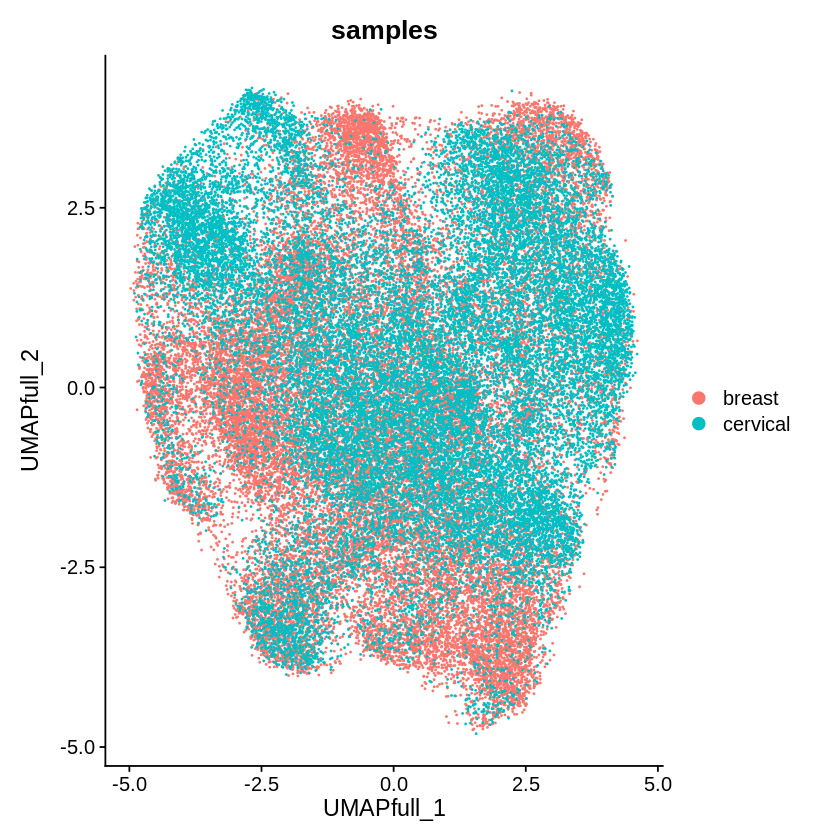

In [52]:
options(repr.plot.width=7, repr.plot.height=7)
DimPlot(macro.obj, reduction = "umap.full", group.by = "samples")

Compute DEG in macrophages between breast cancer and cervical cancer data.

In [ ]:
Idents(object = macro.obj) <- "samples"
macro.obj[["RNA"]] <- JoinLayers(macro.obj[["RNA"]])
macr.marker <-  FindMarkers(macro.obj, ident.1 = "breast", ident.2 = "cervical")

In [54]:
# save DEG results in csv
macr.marker$gene <- rownames(macr.marker)
write.table(macr.marker,"macrophage_DGE.csv", sep=",", col.names = TRUE,
            row.names=FALSE, quote=FALSE)

Based on DEG results, CTSL is significantly higher expressed in breast cancer macrophages compared to cervical cancer.

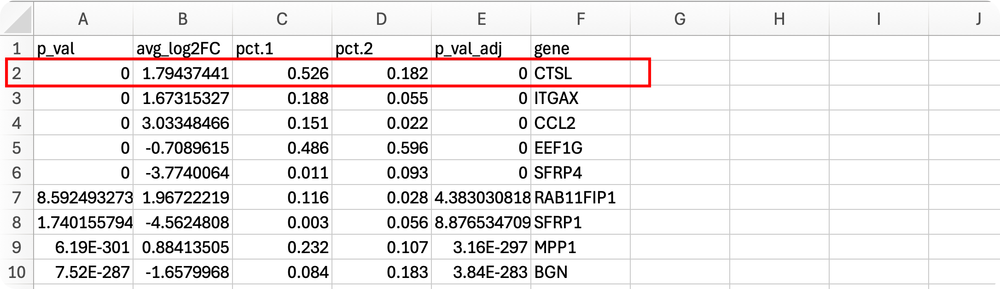

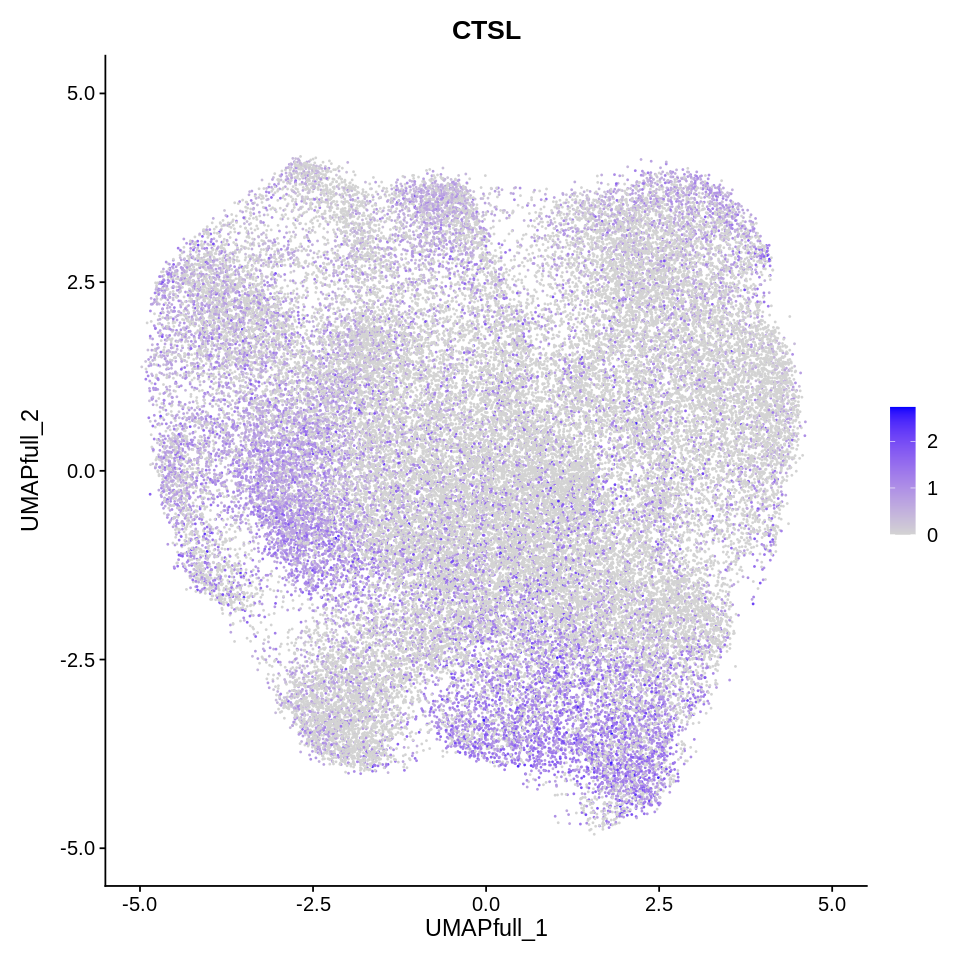

In [55]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(macro.obj, features = c("CTSL"),
               reduction = "umap.full")

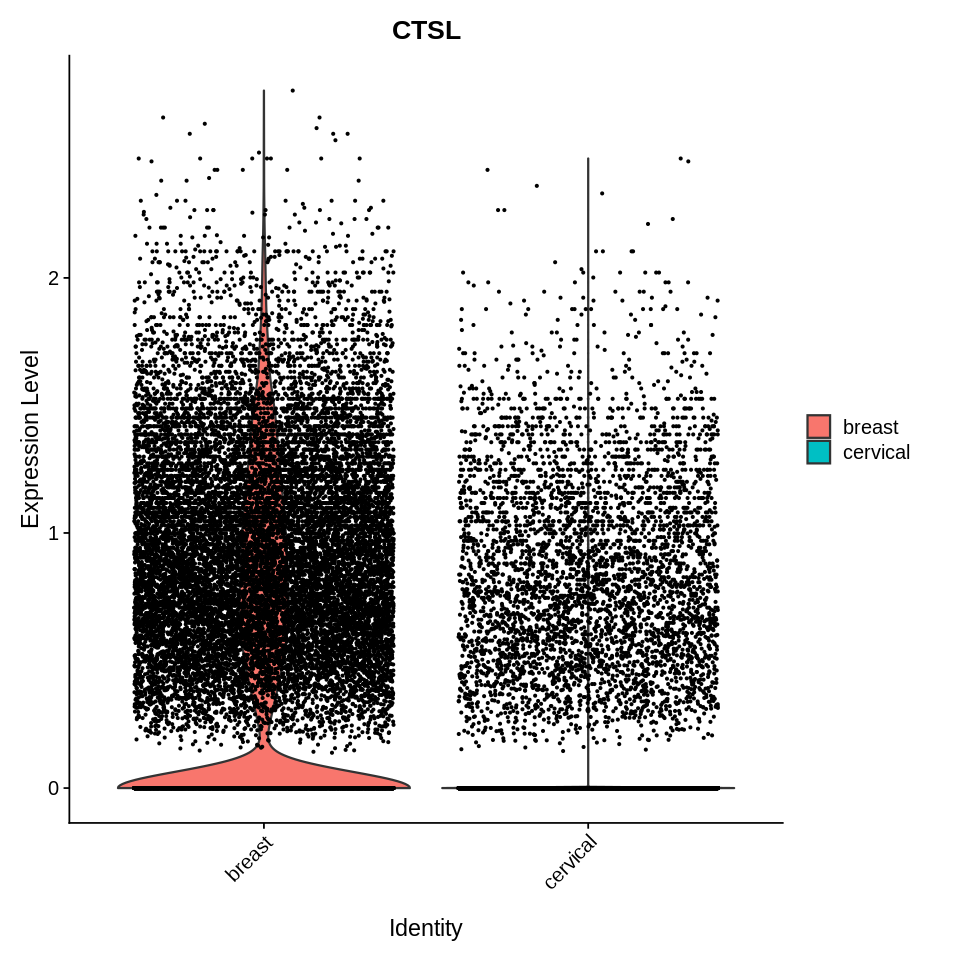

In [56]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(macro.obj, "CTSL", group.by = "samples")

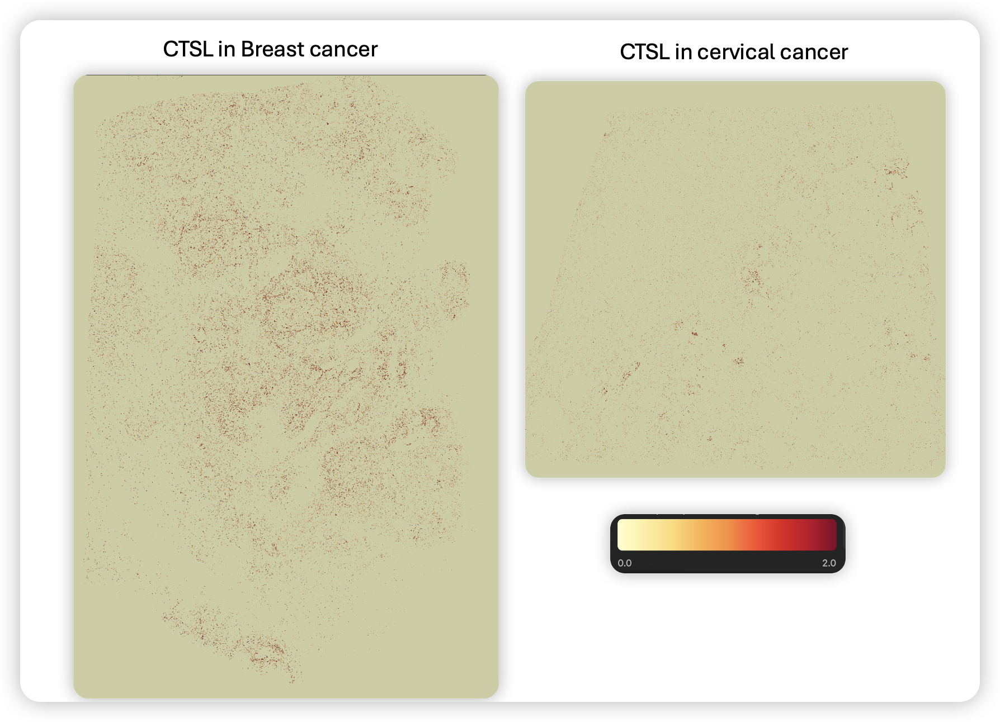

Higher expression of CTSL in macrophages is reported to be associated with tumor progression and poor prognosis ([Zhang, et al., 2024](https://www.sciencedirect.com/science/article/pii/S2405844024053040), [Alderton, 2010](https://www.nature.com/articles/nrc2816), [Xiao, et al., 2024](https://www.wjgnet.com/1007-9327/full/v30/i47/5032.htm)). Our analysis of the tutorial data, shows higher expression of CTSL in breast cancer tissue macrophages, suggesting more of a pro-tumor role of macrophages in breast cancer compared to cervical cancer.

# [Additional Topics] 4. Spatially-informed clustering

The above clustering method uses each cell's own gene expression profile, which is the same strategy in single cell data analysis. Though it works effectively, spatial information in Xenium data is not utilized. In this section, we will include Xenium spatial information for clustering (referred to as spatially-informed clustering). We use the Banksy tool here ([Singhal, et al., 2024](https://www.nature.com/articles/s41588-024-01664-3)).

Banksy uses cells' own gene expression, mean gene expression in neighboring cells, as well as gene expression gradient information in neighboring cells to cluster cells. A benchmarking study ranked Banksy as one of top performing tools with scalability in spatial clustering ([Hu, et al., 2024](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-024-03361-0)).

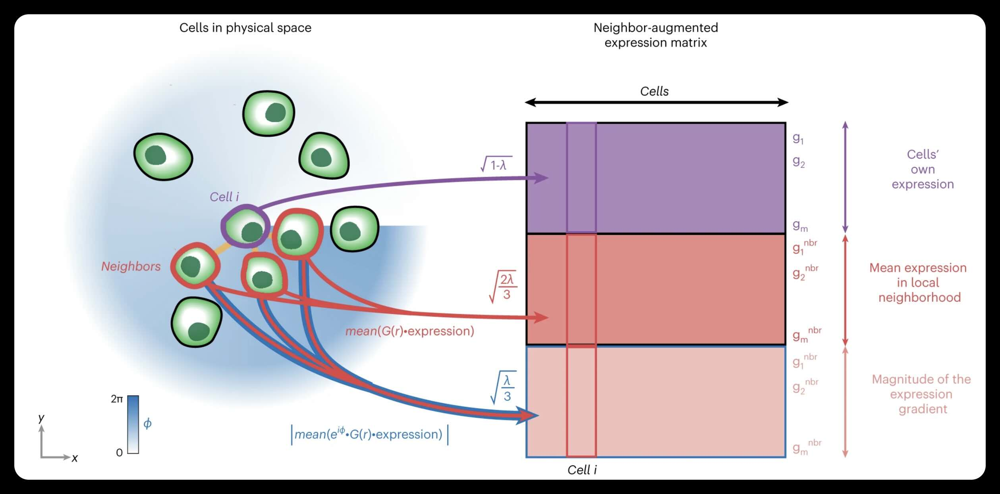

Adopted from Figure 1a in [Singhal, et al., 2024](https://www.nature.com/articles/s41588-024-01664-3)

**What do I need to prepare?**

You only need to provide the following four files:


*   `cell_feature_matrix/` (cell-level gene expression)
*   `cell_boundaries.parquet` (visualization of cell segmnetation)
*   `cells.parquet` (cell level information)
*   `transcripts.parquet` (transcript level information)


In [57]:
# required for Banksy package
system("sudo apt-get install libmagick++-dev")

library(Seurat)
library(sf)
library(ggplot2)
library(Banksy)
library(SeuratWrappers)

## 4.1 Data downloading and preprocessing

In [ ]:
# get human breast cancer Xenium prime data
system("wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/one-sample-analysis.tar.gz")
system("tar -xzvf ./one-sample-analysis.tar.gz")

In [ ]:
xenium.obj <- LoadXenium("./one-sample-analysis/Xenium_Prime_Breast_Cancer_FFPE_outs",
                         fov = "fov", segmentations="cell", flip.xy=TRUE)

The first step is QC. We want to remove cells with low transcript counts. Here we plot the distribution of transcript counts per cell in a histogram to determine the transcript count cutoff to remove cells with low transcript counts. The determination of lower cutoff can be subjective. There is no gold-standard rule.

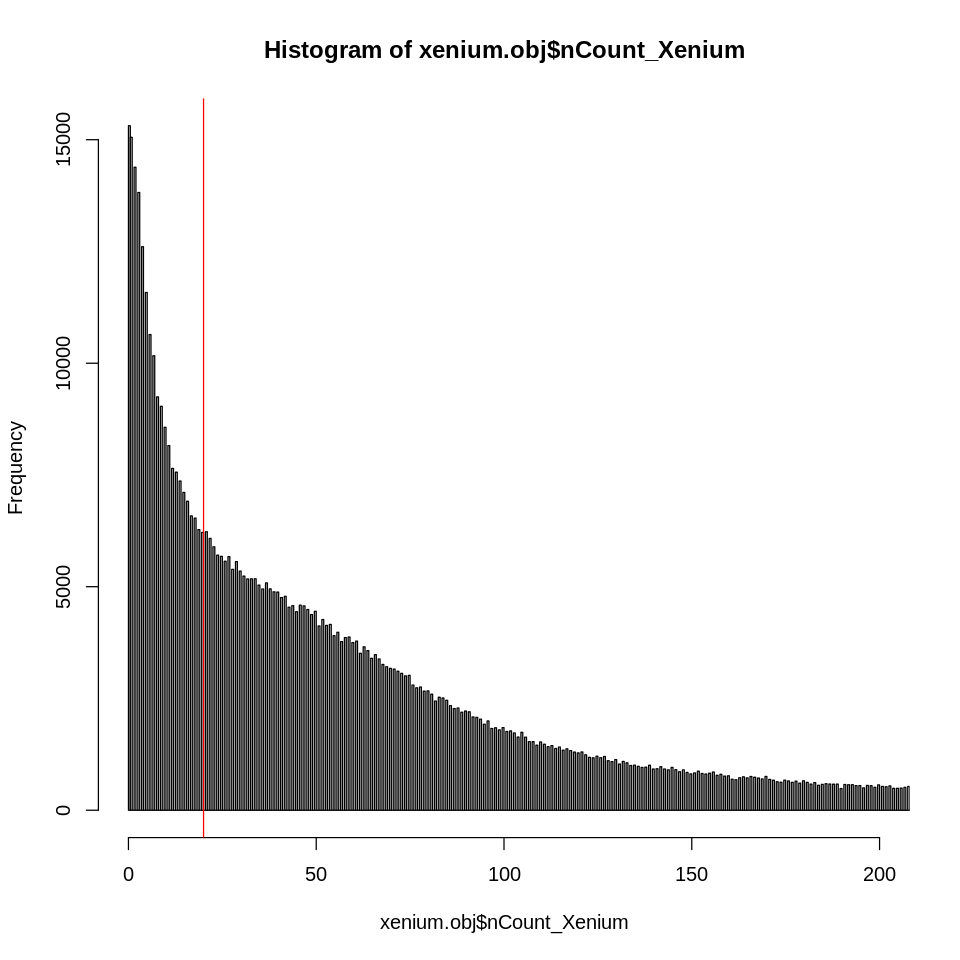

In [59]:
# based on the histogram plot, here we choose 20 transcript counts as lower cutoff
hist(xenium.obj$nCount_Xenium, xlim=c(0,200), breaks = 5000)
abline(v = 20, col="red")

In [ ]:
## QC
## filtering cells based on detected transcripts per cell
## Upper limit cutoff - 98th percentile
## Lower limit cutoff - 20 determined by the previous plot

thres <- quantile(xenium.obj$nCount_Xenium, c(0.98))
xenium.obj <- subset(xenium.obj, subset = nCount_Xenium >= 20 & nCount_Xenium <= thres[1])

Run conventional preprocessing analysis, including normalization, feature selection, and scaling.

In [ ]:
## Normalization
## library size based normalization, scale factor - median transcript count
xenium.obj <- NormalizeData(xenium.obj, scale.factor=median(xenium.obj$nCount_Xenium))

In the following step, `FindVariableFeatures` is used for feature selection (top 2k).

If you are analyzing Xenium v1 panel data, it's impossible to have top 2k variable genes. In that case, you can use all genes in the panel as variable genes. Run this code instead if you are using Xenium v1 panel:


`xenium.obj <- FindVariableFeatures(xenium.obj, nfeatures=nrow(xenium.obj))`

The following code is for Xenium Prime data (>5k genes).

In [ ]:
## Find top 2k variable genes
xenium.obj <- FindVariableFeatures(xenium.obj)

In [ ]:
## data scaling
xenium.obj <- ScaleData(xenium.obj)

## 4.2 Running Banksy

We can simply use `RunBanksy` function to calculate mean gene expression and gradient expression in neighboring cells, and use them together with cells' own gene expression to do clustering.

For Xenium data, use `lambda = 0.2` for cell typing. The lambda value controls the amount of neighborhood information incorporated during analysis. When `lambda = 0`, it means only use cells' own gene expression, without neighborhood information.

The other value `k_geom` controls the number of neighboring cells to define neighborhood. Here we use 15.



In [ ]:
# 11 mins for 490k-cell Xenium Prime data

# RunBanksy computes neighouring cell gene expression information
xenium.obj <- RunBanksy(xenium.obj, lambda = 0.2, k_geom = 15, assay = "Xenium",
                        slot = "data", features = "variable", verbose=FALSE)

In [65]:
xenium.obj

An object of class Seurat 
10181 features across 490610 samples within 6 assays 
Active assay: BANKSY (4000 features, 0 variable features)
 2 layers present: data, scale.data
 5 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe, GenomicControl
 1 spatial field of view present: fov

In [ ]:
# Perform PCA on cells' own gene expression and gene expression in neighborhood
xenium.obj <- RunPCA(xenium.obj, assay = 'BANKSY',
                    features = rownames(xenium.obj), npcs = 30)

In [ ]:
xenium.obj <- FindNeighbors(xenium.obj, dims = 1:30)
xenium.obj <- FindClusters(xenium.obj, resolution = .5)

In [68]:
xenium.obj <- RunUMAP(xenium.obj, dims = 1:30, verbose = FALSE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



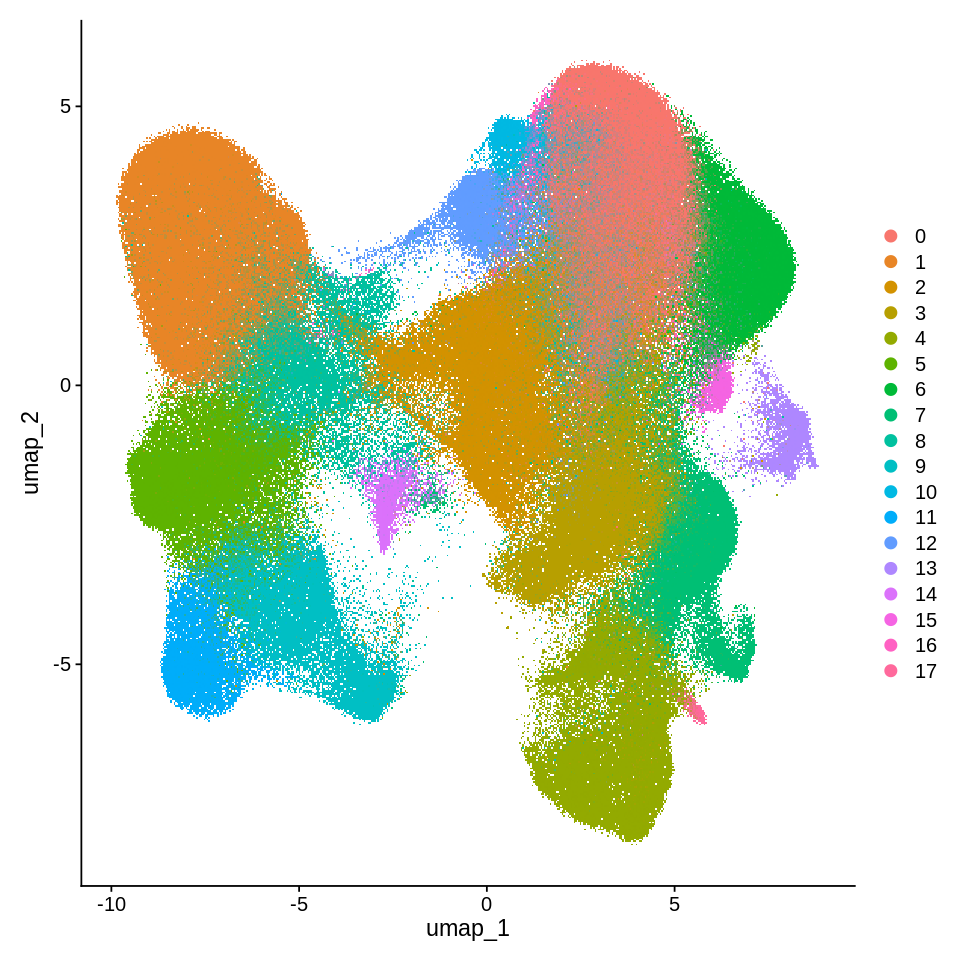

In [69]:
DimPlot(xenium.obj)

## 4.3 Export Banksy clustering results and visualize in Xenium Explorer

Similar to Section 2.5.4, here we export Banksy clustering results and import them to Xenium Explorer.

Refer to Section 2.5.4 for more details about importing the clustering CSV file in Xenium Explorer.

In [70]:
# generate a table with one columns - one for cell id and the other for group (clustering)
clustering_res <- FetchData(xenium.obj, vars = c("seurat_clusters"))
clustering_res$cell_id <- rownames(clustering_res)

clustering_res <- clustering_res[,c("cell_id","seurat_clusters")]
colnames(clustering_res) <- c("cell_id","group")

head(clustering_res, n = 3)

,cell_id,group
,<chr>,<fct>
aaaaaohf-1,aaaaaohf-1,1
aaaafefl-1,aaaafefl-1,1
aaaahjao-1,aaaahjao-1,1


In [ ]:
# save the table in csv file
write.table(clustering_res, "banksy_clustering_results.csv",
            col.names=TRUE, row.names=FALSE, quote=FALSE, sep=",")